### <a> 1. Thư viện </a>

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime
import warnings
warnings.filterwarnings('ignore')
from tqdm.autonotebook import tqdm

# Import thư viện cần thiết cho phân cụm
from sklearn.cluster import DBSCAN, AgglomerativeClustering
from sklearn.mixture import GaussianMixture
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
from sklearn.manifold import TSNE, MDS
from sklearn.decomposition import PCA
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.signal import butter, filtfilt
import warnings
warnings.filterwarnings('ignore')
SEED=23

# Thiết lập style cho matplotlib
plt.style.use('seaborn-v0_8')
plt.rcParams['figure.figsize'] = (12, 8)
plt.rcParams['font.size'] = 10

print("Đã import thành công các thư viện cần thiết!")

Đã import thành công các thư viện cần thiết!


### <a> 2. Load Data

In [4]:
# Đọc dữ liệu từ file CSV
print("Đang đọc file full_gnss_3e.csv...")
df = pd.read_csv('E:/CODE_PHANCUM/full_gnss_3e.csv')

# Chuyển đổi cột Timestamp thành datetime
df['Timestamp'] = pd.to_datetime(df['Timestamp'])

# Tạo cột Date để phân chia theo ngày
df['Date'] = df['Timestamp'].dt.date

# Hiển thị thông tin cơ bản về dữ liệu
print(f"Tổng số dòng dữ liệu: {len(df):,}")
print(f"Khoảng thời gian: từ {df['Timestamp'].min()} đến {df['Timestamp'].max()}")
print(f"Số ngày có dữ liệu: {df['Date'].nunique()}")

# Hiển thị 5 dòng đầu tiên
print("\n5 dòng đầu tiên:")
df.head()

Đang đọc file full_gnss_3e.csv...
Tổng số dòng dữ liệu: 897,795
Khoảng thời gian: từ 2015-05-29 02:44:18 đến 2015-06-11 04:43:00
Số ngày có dữ liệu: 13

5 dòng đầu tiên:


,Timestamp,X_Coord,Y_Coord,h_Coord,Date
0,2015-05-29 02:44:18,85263.209,2332639.654,16.444,2015-05-29
1,2015-05-29 02:44:19,85263.197,2332639.659,16.432,2015-05-29
2,2015-05-29 02:44:20,85263.198,2332639.658,16.423,2015-05-29
3,2015-05-29 02:44:21,85263.194,2332639.656,16.413,2015-05-29
4,2015-05-29 02:44:22,85263.190,2332639.652,16.408,2015-05-29


In [5]:
# Phân tích dữ liệu theo từng ngày
daily_stats = df.groupby('Date').agg({
    'X_Coord': ['count', 'mean', 'std', 'min', 'max'],
    'Y_Coord': ['mean', 'std', 'min', 'max'],
    'h_Coord': ['mean', 'std', 'min', 'max'],
    'Timestamp': ['min', 'max']
}).round(3)

# Làm phẳng tên cột
daily_stats.columns = ['_'.join(col).strip() for col in daily_stats.columns]

print("Thống kê dữ liệu GNSS theo từng ngày:")
print("="*80)
daily_stats

Thống kê dữ liệu GNSS theo từng ngày:


,X_Coord_count,X_Coord_mean,X_Coord_std,X_Coord_min,X_Coord_max,Y_Coord_mean,Y_Coord_std,Y_Coord_min,Y_Coord_max,h_Coord_mean,h_Coord_std,h_Coord_min,h_Coord_max,Timestamp_min,Timestamp_max
Date,,,,,,,,,,,,,,,
2015-05-29,25054,85263.427,0.039,85260.463,85264.118,2332639.835,0.038,2332639.089,2332643.024,16.107,0.113,14.490,29.344,2015-05-29 02:44:18,2015-05-29 12:30:56
2015-05-30,77872,85263.429,0.012,85262.883,85263.834,2332639.846,0.008,2332639.705,2332640.234,16.134,0.034,16.016,17.329,2015-05-30 00:42:17,2015-05-30 23:59:59
2015-05-31,44472,85263.428,0.006,85263.334,85263.477,2332639.846,0.006,2332639.784,2332639.887,16.135,0.021,15.734,16.244,2015-05-31 00:00:00,2015-05-31 12:22:55
2015-06-02,76877,85263.431,0.009,85262.994,85263.638,2332639.853,0.013,2332639.232,2332640.220,16.145,0.025,15.364,17.853,2015-06-02 02:30:26,2015-06-02 23:59:59
2015-06-03,80626,85263.432,0.015,85262.108,85266.061,2332639.850,0.019,2332639.234,2332643.134,16.139,0.037,12.315,19.438,2015-06-03 00:00:00,2015-06-03 23:59:59
2015-06-04,85940,85263.428,0.008,85263.023,85263.619,2332639.845,0.015,2332639.279,2332640.279,16.133,0.036,14.563,17.433,2015-06-04 00:00:00,2015-06-04 23:59:59
2015-06-05,85792,85263.432,0.006,85262.676,85263.449,2332639.857,0.007,2332639.636,2332640.209,16.148,0.018,14.721,16.734,2015-06-05 00:00:00,2015-06-05 23:59:59
2015-06-06,86291,85263.432,0.008,85262.941,85264.694,2332639.854,0.014,2332636.446,2332640.245,16.150,0.032,13.746,23.463,2015-06-06 00:00:00,2015-06-06 23:59:59
2015-06-07,85487,85263.432,0.009,85263.292,85264.811,2332639.859,0.009,2332638.200,2332640.274,16.148,0.025,15.522,22.016,2015-06-07 00:00:00,2015-06-07 23:59:59


In [6]:
# Tạo ma trận 1 chiều với mỗi hàng là dữ liệu của 1 ngày theo giây
print("Đang tạo ma trận dữ liệu theo giây cho mỗi ngày...")

# Tạo cột giây trong ngày từ Timestamp
df['Second_of_day'] = df['Timestamp'].dt.hour * 3600 + df['Timestamp'].dt.minute * 60 + df['Timestamp'].dt.second

# Lấy danh sách các ngày duy nhất và sắp xếp
unique_dates = sorted(df['Date'].unique())
print(f"Số ngày có dữ liệu: {len(unique_dates)}")

# Tạo ma trận với 86400 cột (số giây trong 1 ngày)
seconds_per_day = 86400
daily_matrix = np.full((len(unique_dates), seconds_per_day), np.nan)

print(f"Kích thước ma trận: {daily_matrix.shape} (ngày × giây)")

# Điền dữ liệu vào ma trận
for i, date in enumerate(unique_dates):
    # Lọc dữ liệu cho ngày cụ thể
    day_data = df[df['Date'] == date].copy()
    
    # Điền dữ liệu h_Coord vào vị trí tương ứng với giây trong ngày
    for _, row in day_data.iterrows():
        second_idx = int(row['Second_of_day'])
        if 0 <= second_idx < seconds_per_day:
            daily_matrix[i, second_idx] = row['h_Coord']
    
    print(f"Ngày {date}: {day_data.shape[0]:,} điểm dữ liệu")

# Thống kê về dữ liệu thiếu
total_elements = daily_matrix.size
nan_count = np.isnan(daily_matrix).sum()
data_count = total_elements - nan_count

print(f"\nThống kê ma trận:")
print(f"- Tổng số phần tử: {total_elements:,}")
print(f"- Số phần tử có dữ liệu: {data_count:,}")
print(f"- Số phần tử thiếu (NaN): {nan_count:,}")
print(f"- Tỷ lệ dữ liệu có: {data_count/total_elements*100:.2f}%")
print(f"- Tỷ lệ dữ liệu thiếu: {nan_count/total_elements*100:.2f}%")

Đang tạo ma trận dữ liệu theo giây cho mỗi ngày...
Số ngày có dữ liệu: 13
Kích thước ma trận: (13, 86400) (ngày × giây)
Ngày 2015-05-29: 25,054 điểm dữ liệu
Ngày 2015-05-30: 77,872 điểm dữ liệu
Ngày 2015-05-31: 44,472 điểm dữ liệu
Ngày 2015-06-02: 76,877 điểm dữ liệu
Ngày 2015-06-03: 80,626 điểm dữ liệu
Ngày 2015-06-04: 85,940 điểm dữ liệu
Ngày 2015-06-05: 85,792 điểm dữ liệu
Ngày 2015-06-06: 86,291 điểm dữ liệu
Ngày 2015-06-07: 85,487 điểm dữ liệu
Ngày 2015-06-08: 86,055 điểm dữ liệu
Ngày 2015-06-09: 59,992 điểm dữ liệu
Ngày 2015-06-10: 86,356 điểm dữ liệu
Ngày 2015-06-11: 16,981 điểm dữ liệu

Thống kê ma trận:
- Tổng số phần tử: 1,123,200
- Số phần tử có dữ liệu: 897,795
- Số phần tử thiếu (NaN): 225,405
- Tỷ lệ dữ liệu có: 79.93%
- Tỷ lệ dữ liệu thiếu: 20.07%


Đang tạo biểu đồ dữ liệu theo ngày...


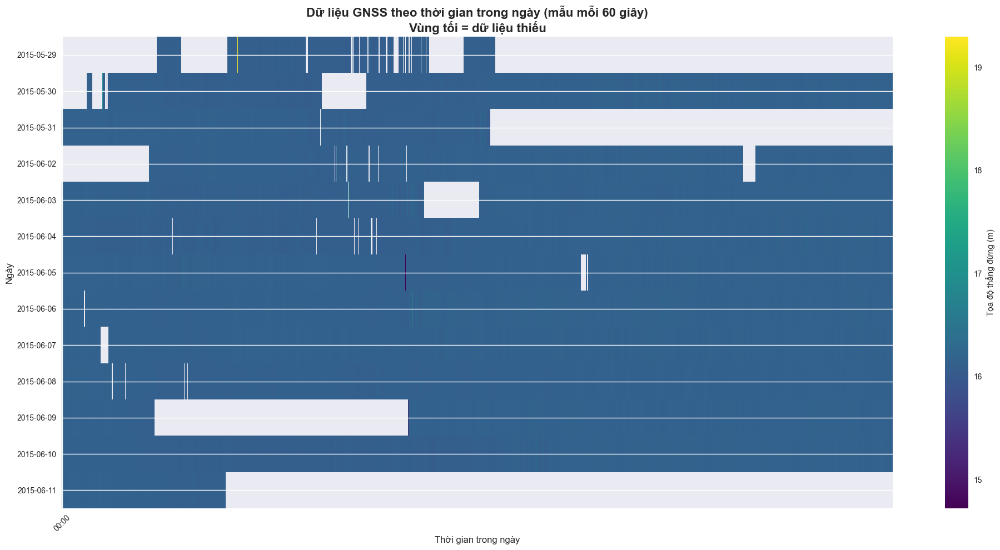

Biểu đồ heatmap đã được tạo với dữ liệu mẫu mỗi 60 giây


In [7]:
# Vẽ biểu đồ dữ liệu theo ngày
print("Đang tạo biểu đồ dữ liệu theo ngày...")

# 1. Biểu đồ heatmap tổng quan
plt.figure(figsize=(20, 10))

# Tạo ma trận con để hiển thị (lấy mẫu mỗi 60 giây để tránh quá tải)
sample_interval = 60  # lấy mẫy mỗi 60 giây
sampled_matrix = daily_matrix[:, ::sample_interval]
time_labels = [f"{h:02d}:{m:02d}" for h in range(24) for m in range(0, 60, sample_interval)]

plt.imshow(sampled_matrix, aspect='auto', cmap='viridis', interpolation='nearest')
plt.colorbar(label='Tọa độ thẳng đứng (m)')
plt.title('Dữ liệu GNSS theo thời gian trong ngày (mẫu mỗi 60 giây)\nVùng tối = dữ liệu thiếu', 
          fontsize=16, fontweight='bold')
plt.xlabel('Thời gian trong ngày', fontsize=12)
plt.ylabel('Ngày', fontsize=12)

# Thiết lập nhãn trục x (hiển thị mỗi 2 giờ)
x_ticks = list(range(0, len(time_labels), 120))  # mỗi 2 giờ
x_labels = [time_labels[i] for i in x_ticks]
plt.xticks(x_ticks, x_labels, rotation=45)

# Thiết lập nhãn trục y
plt.yticks(range(len(unique_dates)), [str(date) for date in unique_dates])

plt.tight_layout()
plt.show()

print(f"Biểu đồ heatmap đã được tạo với dữ liệu mẫu mỗi {sample_interval} giây")

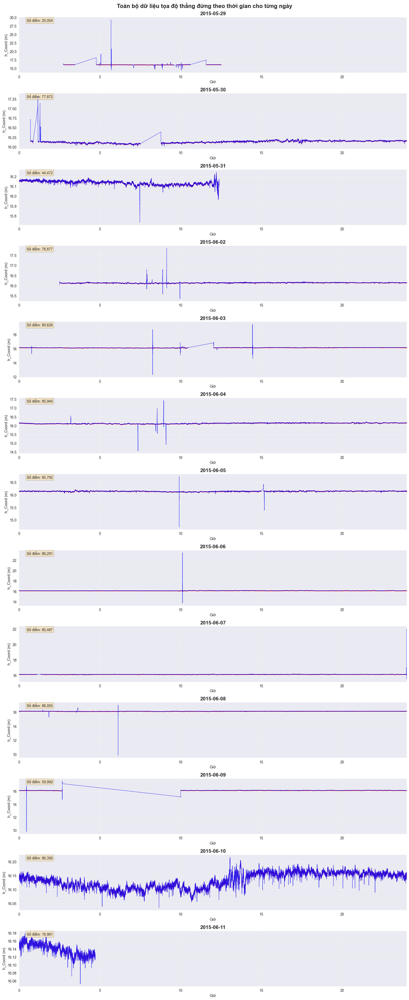

Đã tạo xong biểu đồ 1 cột với mỗi hàng là 1 ngày


In [8]:
# Tạo biểu đồ 1 cột với mỗi hàng là 1 ngày
fig, axes = plt.subplots(len(unique_dates), 1, figsize=(16, 3*len(unique_dates)))

# Đảm bảo axes là array nếu chỉ có 1 subplot
if len(unique_dates) == 1:
    axes = [axes]

for i, date in enumerate(unique_dates):
    # Lấy dữ liệu cho ngày này
    daily_data = daily_matrix[i, :]
    
    # Tạo trục thời gian (giây trong ngày)
    time_seconds = np.arange(len(daily_data))
    
    #
    valid_mask = ~np.isnan(daily_data)
    valid_times = time_seconds[valid_mask]
    valid_values = daily_data[valid_mask]
    
    # Chuyển đổi giây thành giờ để hiển thị
    valid_hours = valid_times / 3600
    
    # Vẽ biểu đồ chỉ với dữ liệu có giá trị (bỏ trống NaN)
    if len(valid_values) > 0:
        axes[i].plot(valid_hours, valid_values, 'b-', linewidth=0.8, alpha=0.8)
        axes[i].scatter(valid_hours, valid_values, c='red', s=0.3, alpha=0.4)
    
    axes[i].set_title(f'{date}', fontsize=14, fontweight='bold')
    axes[i].set_xlabel('Giờ', fontsize=11)
    axes[i].set_ylabel('h_Coord (m)', fontsize=11)
    axes[i].grid(True, alpha=0.3)
    axes[i].set_xlim(0, 24)
    
    # Thêm thống kê
    if len(valid_values) > 0:
        axes[i].text(0.02, 0.98, f'Số điểm: {len(valid_values):,}', 
                    transform=axes[i].transAxes, fontsize=10, 
                    verticalalignment='top', bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.7))

plt.suptitle('Toàn bộ dữ liệu tọa độ thẳng đứng theo thời gian cho từng ngày', 
             fontsize=16, fontweight='bold', y=0.995)
plt.tight_layout()
plt.show()

print("Đã tạo xong biểu đồ 1 cột với mỗi hàng là 1 ngày")


In [9]:
# Lưu ma trận dữ liệu và tạo functions tiện ích
print("Đang lưu ma trận dữ liệu...")

# Lưu ma trận ra file numpy
matrix_file = './gnss_1e_daily_matrix.npy'
np.save(matrix_file, daily_matrix)
print(f"Đã lưu ma trận vào file: {matrix_file}")

# Lưu danh sách ngày
dates_file = './gnss_1e_dates.npy'
np.save(dates_file, unique_dates)
print(f"Đã lưu danh sách ngày vào file: {dates_file}")

# Tạo function để truy xuất dữ liệu
def get_daily_data(date_str, start_time="00:00:00", end_time="23:59:59"):
    """
    Truy xuất dữ liệu tọa độ thẳng đứng cho một ngày và khoảng thời gian cụ thể
    
    Parameters:
    - date_str: Ngày theo định dạng 'YYYY-MM-DD'
    - start_time: Thời gian bắt đầu 'HH:MM:SS'
    - end_time: Thời gian kết thúc 'HH:MM:SS'
    
    Returns:
    - numpy array chứa dữ liệu tọa độ thẳng đứng theo giây
    """
    try:
        target_date = pd.to_datetime(date_str).date()
        
        if target_date not in unique_dates:
            print(f"Không có dữ liệu cho ngày {date_str}")
            return None
        
        # Tìm index của ngày
        date_idx = unique_dates.index(target_date)
        
        # Chuyển đổi thời gian thành giây
        start_seconds = pd.to_datetime(start_time).hour * 3600 + pd.to_datetime(start_time).minute * 60 + pd.to_datetime(start_time).second
        end_seconds = pd.to_datetime(end_time).hour * 3600 + pd.to_datetime(end_time).minute * 60 + pd.to_datetime(end_time).second
        
        # Trích xuất dữ liệu
        day_data = daily_matrix[date_idx, start_seconds:end_seconds+1]
        
        return day_data
        
    except Exception as e:
        print(f"Lỗi: {e}")
        return None

def get_matrix_stats():
    """
    Hiển thị thống kê về ma trận dữ liệu
    """
    print("THỐNG KÊ MA TRẬN DỮ LIỆU:")
    print("="*50)
    print(f"Kích thước ma trận: {daily_matrix.shape}")
    print(f"Số ngày: {len(unique_dates)}")
    print(f"Số giây mỗi ngày: {daily_matrix.shape[1]}")
    print(f"Tổng số phần tử: {daily_matrix.size:,}")
    print(f"Số phần tử có dữ liệu: {(~np.isnan(daily_matrix)).sum():,}")
    print(f"Số phần tử thiếu (NaN): {np.isnan(daily_matrix).sum():,}")
    print(f"Tỷ lệ dữ liệu có: {(~np.isnan(daily_matrix)).sum()/daily_matrix.size*100:.2f}%")
    
    # Thống kê giá trị
    valid_data = daily_matrix[~np.isnan(daily_matrix)]
    print(f"\nThống kê giá trị:")
    print(f"Giá trị trung bình: {valid_data.mean():.3f} m")
    print(f"Độ lệch chuẩn: {valid_data.std():.3f} m")
    print(f"Giá trị min: {valid_data.min():.3f} m")
    print(f"Giá trị max: {valid_data.max():.3f} m")

# Ví dụ sử dụng
print("\nVí dụ sử dụng:")
print("="*30)
sample_data = get_daily_data('2015-06-04', '10:00:00', '10:59:59')
if sample_data is not None:
    valid_points = (~np.isnan(sample_data)).sum()
    print(f"Dữ liệu từ 10:00-10:59 ngày 2015-06-04: {valid_points}/3600 điểm")
    if valid_points > 0:
        valid_values = sample_data[~np.isnan(sample_data)]
        print(f"Giá trị trung bình: {valid_values.mean():.3f} m")

get_matrix_stats()

Đang lưu ma trận dữ liệu...
Đã lưu ma trận vào file: ./gnss_1e_daily_matrix.npy
Đã lưu danh sách ngày vào file: ./gnss_1e_dates.npy

Ví dụ sử dụng:
Dữ liệu từ 10:00-10:59 ngày 2015-06-04: 3600/3600 điểm
Giá trị trung bình: 16.118 m
THỐNG KÊ MA TRẬN DỮ LIỆU:
Kích thước ma trận: (13, 86400)
Số ngày: 13
Số giây mỗi ngày: 86400
Tổng số phần tử: 1,123,200
Số phần tử có dữ liệu: 897,795
Số phần tử thiếu (NaN): 225,405
Tỷ lệ dữ liệu có: 79.93%

Thống kê giá trị:
Giá trị trung bình: 16.141 m
Độ lệch chuẩn: 0.037 m
Giá trị min: 9.813 m
Giá trị max: 29.344 m


In [10]:
# Tạo ma trận phân chia dữ liệu theo giờ với mỗi hàng là dữ liệu theo giây của 1 giờ
print("Đang tạo ma trận dữ liệu theo giờ...")

# Thông số cơ bản
seconds_per_hour = 3600  # 1 giờ = 3600 giây
hours_per_day = 24
total_hours = len(unique_dates) * hours_per_day

print(f"Số ngày: {len(unique_dates)}")
print(f"Tổng số giờ tiềm năng: {total_hours}")

# Tạo danh sách để lưu trữ dữ liệu từng giờ
hourly_data_list = []
hourly_info_list = []  # Lưu thông tin về mỗi giờ (ngày, giờ, tỷ lệ thiếu)

# Phân chia ma trận daily_matrix thành từng giờ
for day_idx, date in enumerate(unique_dates):
    for hour in range(hours_per_day):
        # Lấy dữ liệu cho giờ này
        start_second = hour * seconds_per_hour
        end_second = (hour + 1) * seconds_per_hour
        
        hour_data = daily_matrix[day_idx, start_second:end_second]
        
        # Tính tỷ lệ dữ liệu thiếu
        nan_count = np.isnan(hour_data).sum()
        missing_percentage = (nan_count / seconds_per_hour) * 100
        
        # Lưu thông tin về giờ này
        hourly_info = {
            'date': date,
            'hour': hour,
            'day_idx': day_idx,
            'missing_percentage': missing_percentage,
            'valid_points': seconds_per_hour - nan_count,
            'datetime': f"{date} {hour:02d}:00:00"
        }
        
        hourly_info_list.append(hourly_info)
        hourly_data_list.append(hour_data)

print(f"Đã xử lý {len(hourly_data_list)} giờ dữ liệu")

# Tạo DataFrame để dễ dàng phân tích
hourly_info_df = pd.DataFrame(hourly_info_list)

print(f"\nThống kê ban đầu:")
print(f"- Tổng số giờ: {len(hourly_info_df)}")
print(f"- Tỷ lệ thiếu dữ liệu trung bình: {hourly_info_df['missing_percentage'].mean():.2f}%")
print(f"- Số giờ có dữ liệu thiếu >10%: {(hourly_info_df['missing_percentage'] > 10).sum()}")
print(f"- Số giờ có dữ liệu thiếu ≤10%: {(hourly_info_df['missing_percentage'] <= 10).sum()}")

Đang tạo ma trận dữ liệu theo giờ...
Số ngày: 13
Tổng số giờ tiềm năng: 312
Đã xử lý 312 giờ dữ liệu

Thống kê ban đầu:
- Tổng số giờ: 312
- Tỷ lệ thiếu dữ liệu trung bình: 20.07%
- Số giờ có dữ liệu thiếu >10%: 72
- Số giờ có dữ liệu thiếu ≤10%: 240


In [11]:
# Lọc và tạo ma trận cuối cùng chỉ với các hàng có ≤10% dữ liệu thiếu
print("Đang lọc dữ liệu và tạo ma trận cuối cùng...")

# Lọc các giờ có dữ liệu thiếu ≤10%
missing_threshold = 0
valid_hours_mask = hourly_info_df['missing_percentage'] <= missing_threshold
valid_hours_info = hourly_info_df[valid_hours_mask].copy()

print(f"Lọc với ngưỡng ≤{missing_threshold}% dữ liệu thiếu:")
print(f"- Số giờ hợp lệ: {len(valid_hours_info)}")
print(f"- Số giờ bị loại bỏ: {len(hourly_info_df) - len(valid_hours_info)}")

# Tạo ma trận cuối cùng chỉ với các hàng hợp lệ
valid_indices = valid_hours_info.index.tolist()
hourly_matrix = np.array([hourly_data_list[i] for i in valid_indices])

print(f"\nKích thước ma trận cuối cùng: {hourly_matrix.shape}")
print(f"- Số hàng (giờ hợp lệ): {hourly_matrix.shape[0]}")
print(f"- Số cột (giây trong 1 giờ): {hourly_matrix.shape[1]}")

# Thống kê về ma trận cuối cùng
total_elements_final = hourly_matrix.size
nan_count_final = np.isnan(hourly_matrix).sum()
data_count_final = total_elements_final - nan_count_final

print(f"\nThống kê ma trận cuối cùng:")
print(f"- Tổng số phần tử: {total_elements_final:,}")
print(f"- Số phần tử có dữ liệu: {data_count_final:,}")
print(f"- Số phần tử thiếu (NaN): {nan_count_final:,}")
print(f"- Tỷ lệ dữ liệu có: {data_count_final/total_elements_final*100:.2f}%")
print(f"- Tỷ lệ dữ liệu thiếu: {nan_count_final/total_elements_final*100:.2f}%")

# Hiển thị một số thông tin về các giờ hợp lệ
print(f"\nCác giờ hợp lệ đầu tiên:")
print(valid_hours_info[['datetime', 'missing_percentage', 'valid_points']].head(10).to_string(index=False))

print(f"\nPhân bố theo ngày:")
daily_valid_count = valid_hours_info.groupby('date').size()
for date, count in daily_valid_count.items():
    print(f"  {date}: {count}/24 giờ hợp lệ ({count/24*100:.1f}%)")

Đang lọc dữ liệu và tạo ma trận cuối cùng...
Lọc với ngưỡng ≤0% dữ liệu thiếu:
- Số giờ hợp lệ: 191
- Số giờ bị loại bỏ: 121

Kích thước ma trận cuối cùng: (191, 3600)
- Số hàng (giờ hợp lệ): 191
- Số cột (giây trong 1 giờ): 3600

Thống kê ma trận cuối cùng:
- Tổng số phần tử: 687,600
- Số phần tử có dữ liệu: 687,600
- Số phần tử thiếu (NaN): 0
- Tỷ lệ dữ liệu có: 100.00%
- Tỷ lệ dữ liệu thiếu: 0.00%

Các giờ hợp lệ đầu tiên:
           datetime  missing_percentage  valid_points
2015-05-29 06:00:00                 0.0          3600
2015-05-30 02:00:00                 0.0          3600
2015-05-30 03:00:00                 0.0          3600
2015-05-30 04:00:00                 0.0          3600
2015-05-30 06:00:00                 0.0          3600
2015-05-30 09:00:00                 0.0          3600
2015-05-30 10:00:00                 0.0          3600
2015-05-30 11:00:00                 0.0          3600
2015-05-30 12:00:00                 0.0          3600
2015-05-30 13:00:00           

Đang tạo biểu đồ cho ma trận theo giờ...


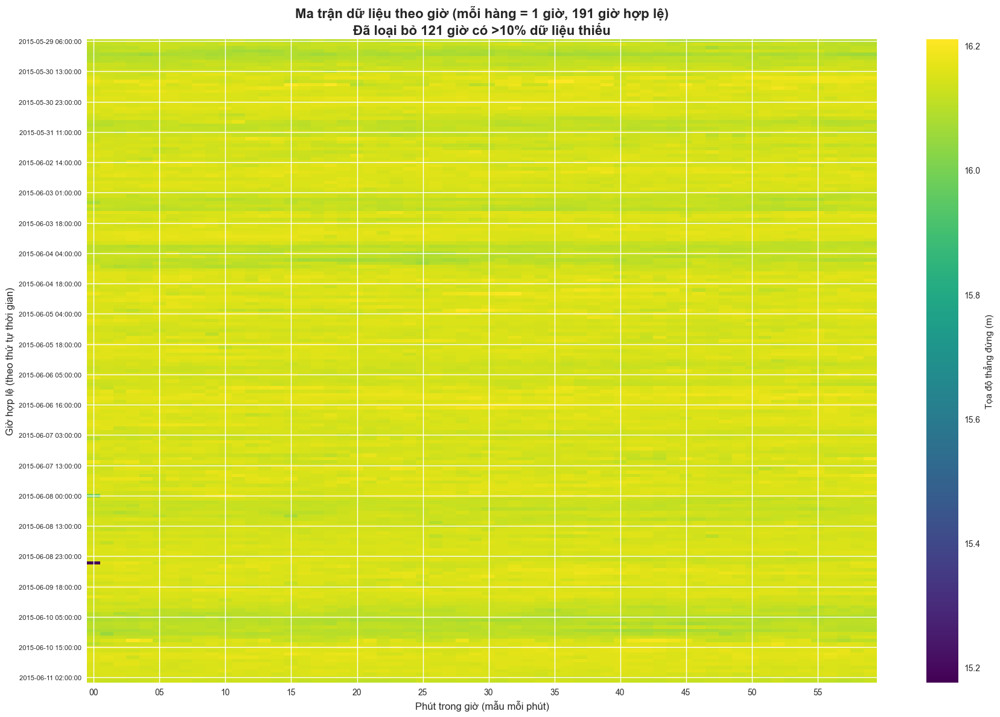

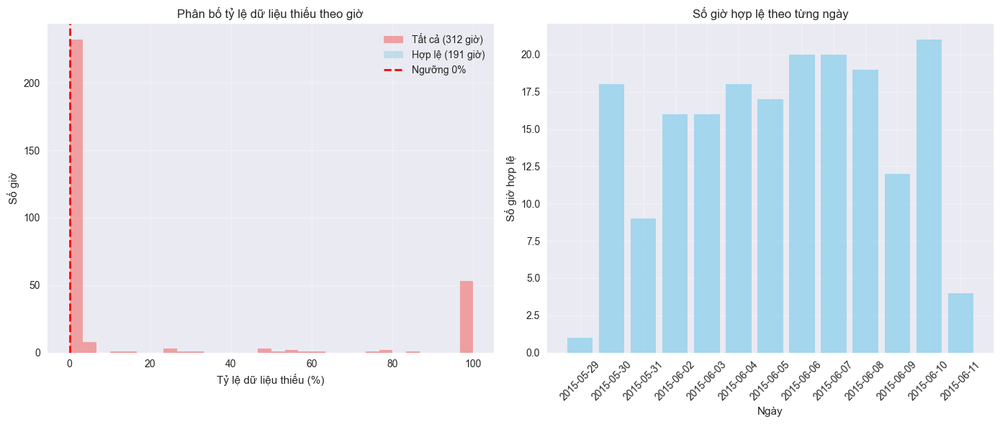

Đã tạo xong các biểu đồ


In [12]:
# Visualize ma trận theo giờ và lưu dữ liệu
print("Đang tạo biểu đồ cho ma trận theo giờ...")

# 1. Biểu đồ heatmap cho ma trận theo giờ
plt.figure(figsize=(18, 12))

# Lấy mẫu dữ liệu để hiển thị (mỗi 60 giây)
sample_interval = 60
sampled_hourly_matrix = hourly_matrix[:, ::sample_interval]

plt.imshow(sampled_hourly_matrix, aspect='auto', cmap='viridis', interpolation='nearest')
plt.colorbar(label='Tọa độ thẳng đứng (m)')
plt.title(f'Ma trận dữ liệu theo giờ (mỗi hàng = 1 giờ, {len(hourly_matrix)} giờ hợp lệ)\n' + 
          f'Đã loại bỏ {len(hourly_info_df) - len(valid_hours_info)} giờ có >10% dữ liệu thiếu', 
          fontsize=16, fontweight='bold')
plt.xlabel('Phút trong giờ (mẫu mỗi phút)', fontsize=12)
plt.ylabel('Giờ hợp lệ (theo thứ tự thời gian)', fontsize=12)

# Thiết lập nhãn trục x (phút trong giờ)
x_ticks = list(range(0, 60, 5))  # mỗi 5 phút
plt.xticks(x_ticks, [f'{i:02d}' for i in x_ticks])

# Hiển thị một số nhãn cho trục y
y_step = max(1, len(hourly_matrix) // 20)  # Hiển thị tối đa 20 nhãn
y_ticks = list(range(0, len(hourly_matrix), y_step))
y_labels = [valid_hours_info.iloc[i]['datetime'] for i in y_ticks]
plt.yticks(y_ticks, y_labels, fontsize=8)

plt.tight_layout()
plt.show()

# 2. Biểu đồ phân bố tỷ lệ dữ liệu thiếu
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
plt.hist(hourly_info_df['missing_percentage'], bins=30, alpha=0.7, color='lightcoral', 
         label=f'Tất cả ({len(hourly_info_df)} giờ)')
plt.hist(valid_hours_info['missing_percentage'], bins=30, alpha=0.7, color='lightblue', 
         label=f'Hợp lệ ({len(valid_hours_info)} giờ)')
plt.axvline(missing_threshold, color='red', linestyle='--', linewidth=2, 
            label=f'Ngưỡng {missing_threshold}%')
plt.xlabel('Tỷ lệ dữ liệu thiếu (%)')
plt.ylabel('Số giờ')
plt.title('Phân bố tỷ lệ dữ liệu thiếu theo giờ')
plt.legend()
plt.grid(True, alpha=0.3)

plt.subplot(1, 2, 2)
daily_stats = valid_hours_info.groupby('date').size()
plt.bar(range(len(daily_stats)), daily_stats.values, color='skyblue', alpha=0.7)
plt.xlabel('Ngày')
plt.ylabel('Số giờ hợp lệ')
plt.title('Số giờ hợp lệ theo từng ngày')
plt.xticks(range(len(daily_stats)), [str(date) for date in daily_stats.index], rotation=45)
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

print("Đã tạo xong các biểu đồ")

In [13]:
# Lưu ma trận theo giờ và tạo functions tiện ích
print("Đang lưu ma trận theo giờ...")

# Lưu ma trận theo giờ
hourly_matrix_file = './gnss_1e_hourly_matrix.npy'
np.save(hourly_matrix_file, hourly_matrix)
print(f"Đã lưu ma trận theo giờ vào: {hourly_matrix_file}")

# Lưu thông tin về các giờ hợp lệ
hourly_info_file = './gnss_1e_hourly_info.csv'
valid_hours_info.to_csv(hourly_info_file, index=False)
print(f"Đã lưu thông tin giờ hợp lệ vào: {hourly_info_file}")

# Tạo functions tiện ích cho ma trận theo giờ
def get_hourly_data(row_index):
    """
    Lấy dữ liệu của một giờ cụ thể từ ma trận
    
    Parameters:
    - row_index: Index của hàng (giờ) trong ma trận
    
    Returns:
    - numpy array chứa dữ liệu 3600 giây của giờ đó
    """
    if 0 <= row_index < len(hourly_matrix):
        return hourly_matrix[row_index, :]
    else:
        print(f"Index {row_index} nằm ngoài phạm vi [0, {len(hourly_matrix)-1}]")
        return None

def find_hour_by_datetime(date_str, hour):
    """
    Tìm index của giờ trong ma trận theo ngày và giờ
    
    Parameters:
    - date_str: Ngày theo định dạng 'YYYY-MM-DD'
    - hour: Giờ (0-23)
    
    Returns:
    - Index của hàng trong ma trận, hoặc None nếu không tìm thấy
    """
    target_datetime = f"{date_str} {hour:02d}:00:00"
    matching_rows = valid_hours_info[valid_hours_info['datetime'] == target_datetime]
    
    if len(matching_rows) > 0:
        return matching_rows.index[0]
    else:
        print(f"Không tìm thấy dữ liệu cho {target_datetime}")
        return None

def get_hourly_matrix_stats():
    """
    Hiển thị thống kê về ma trận theo giờ
    """
    print("THỐNG KÊ MA TRẬN THEO GIỜ:")
    print("="*50)
    print(f"Kích thước ma trận: {hourly_matrix.shape}")
    print(f"Số giờ hợp lệ: {hourly_matrix.shape[0]}")
    print(f"Số giây mỗi giờ: {hourly_matrix.shape[1]}")
    print(f"Tổng số phần tử: {hourly_matrix.size:,}")
    print(f"Số phần tử có dữ liệu: {(~np.isnan(hourly_matrix)).sum():,}")
    print(f"Số phần tử thiếu (NaN): {np.isnan(hourly_matrix).sum():,}")
    print(f"Tỷ lệ dữ liệu có: {(~np.isnan(hourly_matrix)).sum()/hourly_matrix.size*100:.2f}%")
    
    # Thống kê về tỷ lệ thiếu dữ liệu
    print(f"\nThống kê tỷ lệ thiếu dữ liệu:")
    print(f"Tỷ lệ thiếu trung bình: {valid_hours_info['missing_percentage'].mean():.2f}%")
    print(f"Tỷ lệ thiếu tối đa: {valid_hours_info['missing_percentage'].max():.2f}%")
    print(f"Tỷ lệ thiếu tối thiểu: {valid_hours_info['missing_percentage'].min():.2f}%")
    
    # Thống kê giá trị
    valid_data = hourly_matrix[~np.isnan(hourly_matrix)]
    print(f"\nThống kê giá trị:")
    print(f"Giá trị trung bình: {valid_data.mean():.3f} m")
    print(f"Độ lệch chuẩn: {valid_data.std():.3f} m")
    print(f"Giá trị min: {valid_data.min():.3f} m")
    print(f"Giá trị max: {valid_data.max():.3f} m")

# Ví dụ sử dụng
print("\nVí dụ sử dụng:")
print("="*30)

# Tìm và lấy dữ liệu của giờ 10:00 ngày 2015-06-04
row_idx = find_hour_by_datetime('2015-06-04', 10)
if row_idx is not None:
    hour_data = get_hourly_data(row_idx)
    if hour_data is not None:
        valid_points = (~np.isnan(hour_data)).sum()
        print(f"Giờ 10:00 ngày 2015-06-04 (hàng {row_idx}): {valid_points}/3600 điểm")
        
        if valid_points > 0:
            valid_values = hour_data[~np.isnan(hour_data)]
            print(f"Giá trị trung bình: {valid_values.mean():.3f} m")

# Hiển thị thống kê tổng quan
print()
get_hourly_matrix_stats()

Đang lưu ma trận theo giờ...
Đã lưu ma trận theo giờ vào: ./gnss_1e_hourly_matrix.npy
Đã lưu thông tin giờ hợp lệ vào: ./gnss_1e_hourly_info.csv

Ví dụ sử dụng:
Giờ 10:00 ngày 2015-06-04 (hàng 130): 3600/3600 điểm
Giá trị trung bình: 16.158 m

THỐNG KÊ MA TRẬN THEO GIỜ:
Kích thước ma trận: (191, 3600)
Số giờ hợp lệ: 191
Số giây mỗi giờ: 3600
Tổng số phần tử: 687,600
Số phần tử có dữ liệu: 687,600
Số phần tử thiếu (NaN): 0
Tỷ lệ dữ liệu có: 100.00%

Thống kê tỷ lệ thiếu dữ liệu:
Tỷ lệ thiếu trung bình: 0.00%
Tỷ lệ thiếu tối đa: 0.00%
Tỷ lệ thiếu tối thiểu: 0.00%

Thống kê giá trị:
Giá trị trung bình: 16.143 m
Độ lệch chuẩn: 0.021 m
Giá trị min: 15.108 m
Giá trị max: 16.366 m


Đang tạo các biểu đồ visualization cho ma trận theo giờ...


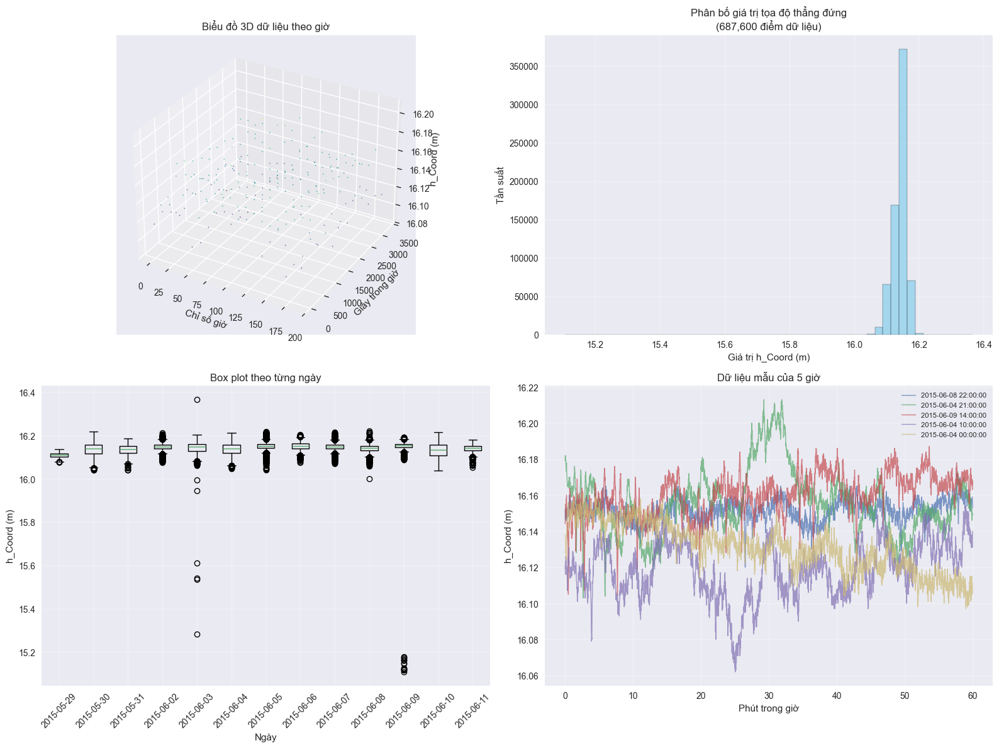

Đã tạo xong biểu đồ tổng quan


In [14]:
# Visualization chi tiết cho bộ dữ liệu phân chia theo giờ
print("Đang tạo các biểu đồ visualization cho ma trận theo giờ...")

# 1. Biểu đồ 3D scatter plot
fig = plt.figure(figsize=(16, 12))

# Subplot 1: 3D scatter plot của dữ liệu theo giờ
ax1 = fig.add_subplot(2, 2, 1, projection='3d')

# Lấy mẫu dữ liệu để hiển thị (mỗi 10 hàng, mỗi 300 giây)
sample_rows = slice(0, len(hourly_matrix), 10)
sample_cols = slice(0, 3600, 300)

# Tạo mesh grid
row_indices, col_indices = np.meshgrid(
    np.arange(len(hourly_matrix))[sample_rows],
    np.arange(3600)[sample_cols],
    indexing='ij'
)

# Lấy dữ liệu mẫu
sample_data = hourly_matrix[sample_rows, sample_cols]
valid_mask = ~np.isnan(sample_data)

# Vẽ scatter plot 3D
scatter = ax1.scatter(
    row_indices[valid_mask], 
    col_indices[valid_mask], 
    sample_data[valid_mask],
    c=sample_data[valid_mask], 
    cmap='viridis', 
    alpha=0.6,
    s=1
)

ax1.set_xlabel('Chỉ số giờ')
ax1.set_ylabel('Giây trong giờ')
ax1.set_zlabel('h_Coord (m)')
ax1.set_title('Biểu đồ 3D dữ liệu theo giờ')

# Subplot 2: Histogram phân bố giá trị
ax2 = fig.add_subplot(2, 2, 2)
valid_data = hourly_matrix[~np.isnan(hourly_matrix)]
ax2.hist(valid_data, bins=50, alpha=0.7, color='skyblue', edgecolor='black')
ax2.set_xlabel('Giá trị h_Coord (m)')
ax2.set_ylabel('Tần suất')
ax2.set_title(f'Phân bố giá trị tọa độ thẳng đứng\n({len(valid_data):,} điểm dữ liệu)')
ax2.grid(True, alpha=0.3)

# Subplot 3: Box plot theo từng ngày
ax3 = fig.add_subplot(2, 2, 3)
daily_data_for_boxplot = []
daily_labels = []

for date in sorted(valid_hours_info['date'].unique()):
    date_mask = valid_hours_info['date'] == date
    date_indices = valid_hours_info[date_mask].index.tolist()
    
    if len(date_indices) > 0:
        date_data = []
        for idx in date_indices:
            row_in_matrix = list(valid_hours_info.index).index(idx)
            hour_values = hourly_matrix[row_in_matrix, :]
            valid_hour_values = hour_values[~np.isnan(hour_values)]
            if len(valid_hour_values) > 0:
                date_data.extend(valid_hour_values)
        
        if len(date_data) > 0:
            daily_data_for_boxplot.append(date_data)
            daily_labels.append(str(date))

ax3.boxplot(daily_data_for_boxplot, labels=daily_labels)
ax3.set_xlabel('Ngày')
ax3.set_ylabel('h_Coord (m)')
ax3.set_title('Box plot theo từng ngày')
ax3.tick_params(axis='x', rotation=45)
ax3.grid(True, alpha=0.3)

# Subplot 4: Line plot của một vài giờ mẫu
ax4 = fig.add_subplot(2, 2, 4)

# Chọn 5 giờ ngẫu nhiên để hiển thị
np.random.seed(42)
sample_hours = np.random.choice(len(hourly_matrix), size=min(5, len(hourly_matrix)), replace=False)

for i, hour_idx in enumerate(sample_hours):
    hour_data = hourly_matrix[hour_idx, :]
    valid_mask = ~np.isnan(hour_data)
    
    if np.sum(valid_mask) > 0:
        time_axis = np.arange(3600)[valid_mask] / 60  # Chuyển sang phút
        valid_values = hour_data[valid_mask]
        
        hour_info = valid_hours_info.iloc[hour_idx]
        label = f"{hour_info['datetime']}"
        
        ax4.plot(time_axis, valid_values, label=label, alpha=0.7, linewidth=1)

ax4.set_xlabel('Phút trong giờ')
ax4.set_ylabel('h_Coord (m)')
ax4.set_title('Dữ liệu mẫu của 5 giờ')
ax4.legend(fontsize=8)
ax4.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

print("Đã tạo xong biểu đồ tổng quan")

Đang tạo heatmap chi tiết và biểu đồ so sánh...


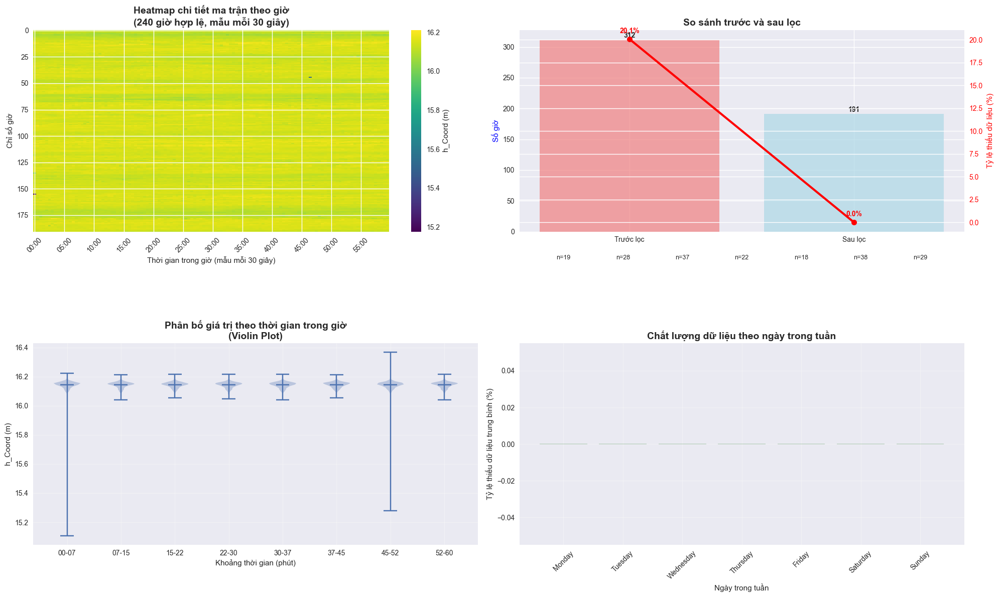

Đã tạo xong heatmap chi tiết và biểu đồ so sánh


In [15]:
# Tạo heatmap chi tiết và so sánh trước/sau lọc
print("Đang tạo heatmap chi tiết và biểu đồ so sánh...")

fig, axes = plt.subplots(2, 2, figsize=(20, 12))

# 1. Heatmap chi tiết của ma trận theo giờ (lấy mẫu mỗi 30 giây)
sample_interval = 30
sampled_matrix = hourly_matrix[:, ::sample_interval]

im1 = axes[0, 0].imshow(sampled_matrix, aspect='auto', cmap='viridis', interpolation='nearest')
axes[0, 0].set_title(f'Heatmap chi tiết ma trận theo giờ\n(240 giờ hợp lệ, mẫu mỗi {sample_interval} giây)', 
                     fontsize=14, fontweight='bold')
axes[0, 0].set_xlabel('Thời gian trong giờ (mẫu mỗi 30 giây)')
axes[0, 0].set_ylabel('Chỉ số giờ')

# Thiết lập nhãn trục x cho heatmap
x_ticks_heatmap = list(range(0, 120, 10))  # mỗi 5 phút
x_labels_heatmap = [f'{i//2:02d}:{(i%2)*30:02d}' for i in x_ticks_heatmap]
axes[0, 0].set_xticks(x_ticks_heatmap)
axes[0, 0].set_xticklabels(x_labels_heatmap, rotation=45)

plt.colorbar(im1, ax=axes[0, 0], label='h_Coord (m)')

# 2. So sánh số lượng dữ liệu trước và sau lọc
categories = ['Trước lọc', 'Sau lọc']
total_hours = [len(hourly_info_df), len(valid_hours_info)]
data_points = [len(hourly_info_df) * 3600, len(hourly_matrix) * 3600]
missing_rates = [hourly_info_df['missing_percentage'].mean(), 
                valid_hours_info['missing_percentage'].mean()]

ax1 = axes[0, 1]
bars1 = ax1.bar(categories, total_hours, color=['lightcoral', 'lightblue'], alpha=0.7)
ax1.set_ylabel('Số giờ', color='blue')
ax1.set_title('So sánh trước và sau lọc', fontsize=14, fontweight='bold')

# Thêm nhãn số liệu lên cột
for bar, value in zip(bars1, total_hours):
    height = bar.get_height()
    ax1.text(bar.get_x() + bar.get_width()/2., height + 1,
             f'{value}', ha='center', va='bottom', fontweight='bold')

# Tạo trục y thứ hai cho tỷ lệ thiếu dữ liệu
ax2 = ax1.twinx()
line = ax2.plot(categories, missing_rates, 'ro-', linewidth=3, markersize=8, label='Tỷ lệ thiếu dữ liệu')
ax2.set_ylabel('Tỷ lệ thiếu dữ liệu (%)', color='red')
ax2.tick_params(axis='y', labelcolor='red')

# Thêm nhãn cho line plot
for i, (cat, rate) in enumerate(zip(categories, missing_rates)):
    ax2.text(i, rate + 0.5, f'{rate:.1f}%', ha='center', va='bottom', 
             fontweight='bold', color='red')

# 3. Biểu đồ violin plot cho phân bố giá trị theo thời gian trong ngày
time_bins = []
time_labels = []
time_data = []

# Chia thành 8 khoảng thời gian (mỗi khoảng 7.5 phút = 450 giây)
n_bins = 8
bin_size = 3600 // n_bins

for bin_idx in range(n_bins):
    start_sec = bin_idx * bin_size
    end_sec = (bin_idx + 1) * bin_size
    
    bin_data = []
    for row_idx in range(len(hourly_matrix)):
        bin_values = hourly_matrix[row_idx, start_sec:end_sec]
        valid_values = bin_values[~np.isnan(bin_values)]
        bin_data.extend(valid_values)
    
    if len(bin_data) > 0:
        time_data.append(bin_data)
        start_min = (start_sec // 60)
        end_min = (end_sec // 60)
        time_labels.append(f'{start_min:02d}-{end_min:02d}')

axes[1, 0].violinplot(time_data, positions=range(len(time_data)), showmeans=True)
axes[1, 0].set_xlabel('Khoảng thời gian (phút)')
axes[1, 0].set_ylabel('h_Coord (m)')
axes[1, 0].set_title('Phân bố giá trị theo thời gian trong giờ\n(Violin Plot)', fontsize=14, fontweight='bold')
axes[1, 0].set_xticks(range(len(time_labels)))
axes[1, 0].set_xticklabels(time_labels)
axes[1, 0].grid(True, alpha=0.3)

# 4. Biểu đồ thống kê theo ngày trong tuần
# Thêm thông tin ngày trong tuần vào valid_hours_info
valid_hours_info['weekday'] = pd.to_datetime(valid_hours_info['date']).dt.day_name()
weekday_stats = valid_hours_info.groupby('weekday').agg({
    'missing_percentage': ['mean', 'std', 'count']
}).round(2)

weekday_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
weekday_data = []

for day in weekday_order:
    if day in weekday_stats.index:
        weekday_data.append({
            'day': day,
            'mean': weekday_stats.loc[day, ('missing_percentage', 'mean')],
            'std': weekday_stats.loc[day, ('missing_percentage', 'std')],
            'count': weekday_stats.loc[day, ('missing_percentage', 'count')]
        })

if weekday_data:
    days = [item['day'] for item in weekday_data]
    means = [item['mean'] for item in weekday_data]
    stds = [item['std'] for item in weekday_data]
    counts = [item['count'] for item in weekday_data]
    
    bars = axes[1, 1].bar(days, means, yerr=stds, capsize=5, 
                         color='lightgreen', alpha=0.7, edgecolor='darkgreen')
    axes[1, 1].set_xlabel('Ngày trong tuần')
    axes[1, 1].set_ylabel('Tỷ lệ thiếu dữ liệu trung bình (%)')
    axes[1, 1].set_title('Chất lượng dữ liệu theo ngày trong tuần', fontsize=14, fontweight='bold')
    axes[1, 1].tick_params(axis='x', rotation=45)
    axes[1, 1].grid(True, alpha=0.3)
    
    # Thêm số lượng mẫu lên mỗi cột
    for bar, count in zip(bars, counts):
        height = bar.get_height()
        axes[1, 1].text(bar.get_x() + bar.get_width()/2., height + 0.1,
                       f'n={count}', ha='center', va='bottom', fontsize=9)

plt.tight_layout()
plt.show()

print("Đã tạo xong heatmap chi tiết và biểu đồ so sánh")

Đang tạo biểu đồ line plots mẫu và thống kê tổng kết...


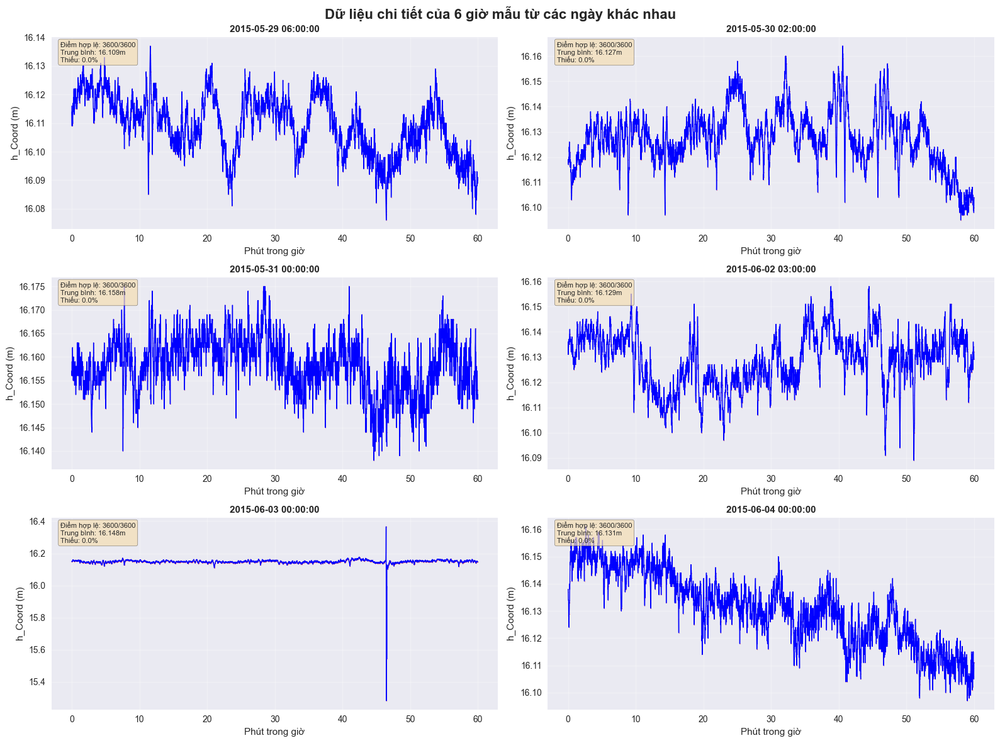


THỐNG KÊ TỔNG KẾT BỘ DỮ LIỆU PHÂN CHIA THEO GIỜ

📊 THỐNG KÊ TỔNG QUAN:
   • Tổng số giờ ban đầu: 312
   • Số giờ hợp lệ (≤10% thiếu): 191 (61.2%)
   • Số giờ bị loại bỏ (>10% thiếu): 121 (38.8%)


In [16]:
# Tạo biểu đồ line plots mẫu và thống kê cuối cùng
print("Đang tạo biểu đồ line plots mẫu và thống kê tổng kết...")

# 1. Chọn và hiển thị 6 giờ mẫu đại diện
fig, axes = plt.subplots(3, 2, figsize=(16, 12))
axes = axes.flatten()

# Chọn các giờ đại diện từ các ngày khác nhau
sample_indices = []
selected_dates = []

for date in sorted(valid_hours_info['date'].unique())[:10]:
    date_rows = valid_hours_info[valid_hours_info['date'] == date]
    if len(date_rows) > 0:
        # Chọn giờ có tỷ lệ thiếu dữ liệu ít nhất
        best_row = date_rows.loc[date_rows['missing_percentage'].idxmin()]
        row_in_matrix = list(valid_hours_info.index).index(best_row.name)
        sample_indices.append(row_in_matrix)
        selected_dates.append(best_row['datetime'])

for i, (hour_idx, datetime_str) in enumerate(zip(sample_indices, selected_dates)):
    if i < 6:
        hour_data = hourly_matrix[hour_idx, :]
        
        # Tạo trục thời gian (giây -> phút)
        time_axis = np.arange(3600) / 60
        
        # Tạo mask cho dữ liệu hợp lệ
        valid_mask = ~np.isnan(hour_data)
        
        # Vẽ tất cả dữ liệu (bao gồm NaN) với màu nhạt
        axes[i].plot(time_axis, hour_data, color='lightgray', alpha=0.5, linewidth=0.5, label='Tất cả')
        
        # Vẽ chỉ dữ liệu hợp lệ với màu đậm
        axes[i].plot(time_axis[valid_mask], hour_data[valid_mask], 
                    color='blue', linewidth=1, label='Dữ liệu hợp lệ')
        
        # Thêm scatter points cho dữ liệu hợp lệ
        axes[i].scatter(time_axis[valid_mask], hour_data[valid_mask], 
                       color='red', s=0.5, alpha=0.3)
        
        axes[i].set_title(f'{datetime_str}', fontsize=11, fontweight='bold')
        axes[i].set_xlabel('Phút trong giờ')
        axes[i].set_ylabel('h_Coord (m)')
        axes[i].grid(True, alpha=0.3)
        
        # Thêm thống kê
        valid_count = np.sum(valid_mask)
        mean_val = np.mean(hour_data[valid_mask]) if valid_count > 0 else 0
        missing_pct = ((3600 - valid_count) / 3600) * 100
        
        stats_text = f'Điểm hợp lệ: {valid_count}/3600\nTrung bình: {mean_val:.3f}m\nThiếu: {missing_pct:.1f}%'
        axes[i].text(0.02, 0.98, stats_text, transform=axes[i].transAxes, 
                    fontsize=8, verticalalignment='top',
                    bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.7))

plt.suptitle('Dữ liệu chi tiết của 6 giờ mẫu từ các ngày khác nhau', 
             fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

# 2. Tạo bảng thống kê tổng kết
print("\n" + "="*80)
print("THỐNG KÊ TỔNG KẾT BỘ DỮ LIỆU PHÂN CHIA THEO GIỜ")
print("="*80)

# Thống kê cơ bản
total_original_hours = len(hourly_info_df)
total_valid_hours = len(valid_hours_info)
total_removed_hours = total_original_hours - total_valid_hours

print(f"\n📊 THỐNG KÊ TỔNG QUAN:")
print(f"   • Tổng số giờ ban đầu: {total_original_hours}")
print(f"   • Số giờ hợp lệ (≤10% thiếu): {total_valid_hours} ({total_valid_hours/total_original_hours*100:.1f}%)")
print(f"   • Số giờ bị loại bỏ (>10% thiếu): {total_removed_hours} ({total_removed_hours/total_original_hours*100:.1f}%)")


Đang tạo visualization cho 20 hàng đầu tiên của ma trận...


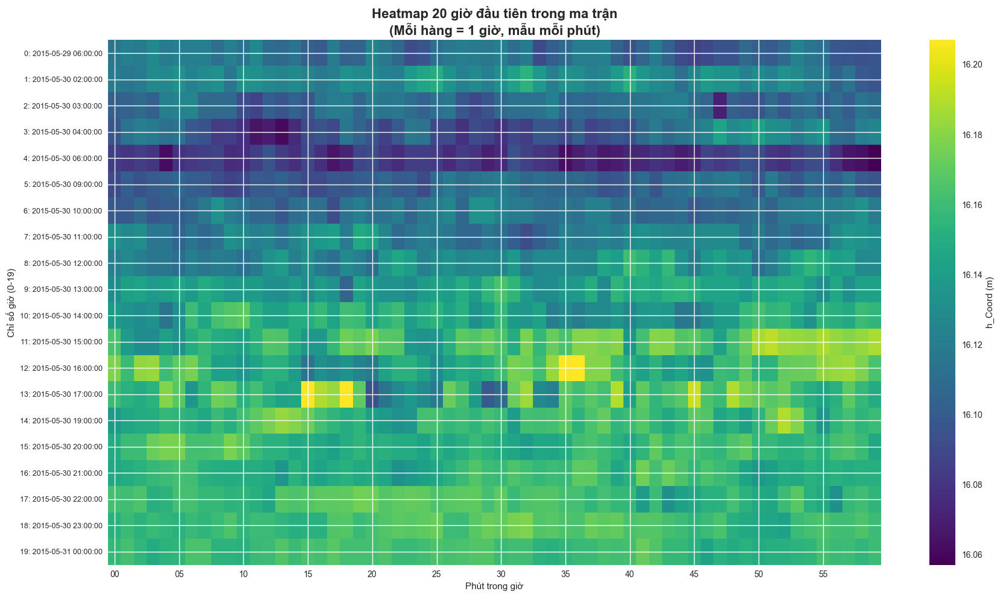

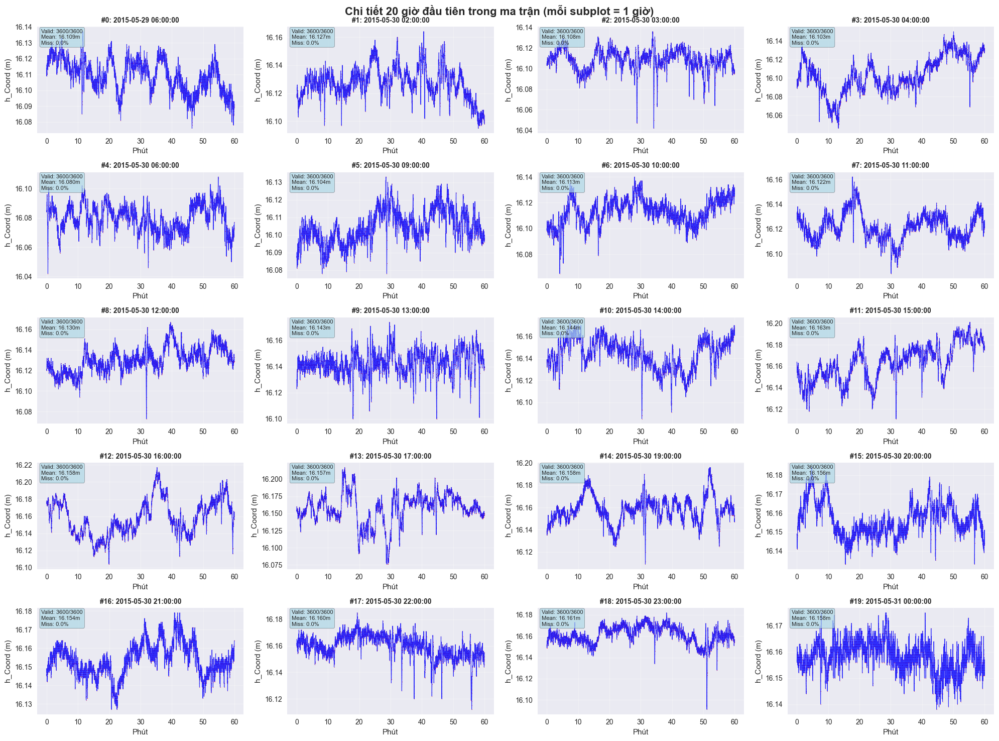


THỐNG KÊ CHI TIẾT 20 HÀ NG ĐẦU TIÊN
 Hàng            Datetime  Điểm hợp lệ  Tỷ lệ thiếu (%)  Trung bình  Độ lệch chuẩn    Min    Max
    0 2015-05-29 06:00:00         3600              0.0      16.109          0.010 16.076 16.137
    1 2015-05-30 02:00:00         3600              0.0      16.127          0.011 16.095 16.164
    2 2015-05-30 03:00:00         3600              0.0      16.108          0.011 16.042 16.136
    3 2015-05-30 04:00:00         3600              0.0      16.103          0.019 16.046 16.150
    4 2015-05-30 06:00:00         3600              0.0      16.080          0.009 16.042 16.108
    5 2015-05-30 09:00:00         3600              0.0      16.104          0.009 16.078 16.133
    6 2015-05-30 10:00:00         3600              0.0      16.113          0.010 16.065 16.140
    7 2015-05-30 11:00:00         3600              0.0      16.122          0.011 16.084 16.162
    8 2015-05-30 12:00:00         3600              0.0      16.130          0.012 16.073 

In [17]:
# Visualize 20 hàng đầu tiên của ma trận theo giờ
print("Đang tạo visualization cho 20 hàng đầu tiên của ma trận...")

# Lấy 20 hàng đầu tiên
first_20_rows = hourly_matrix[:20, :]
first_20_info = valid_hours_info.head(20)

# 1. Heatmap cho 20 hàng đầu tiên
plt.figure(figsize=(18, 10))

# Lấy mẫu mỗi 60 giây để hiển thị rõ hơn
sample_interval = 60
sampled_first_20 = first_20_rows[:, ::sample_interval]

plt.imshow(sampled_first_20, aspect='auto', cmap='viridis', interpolation='nearest')
plt.colorbar(label='h_Coord (m)')
plt.title('Heatmap 20 giờ đầu tiên trong ma trận\n(Mỗi hàng = 1 giờ, mẫu mỗi phút)', 
          fontsize=16, fontweight='bold')
plt.xlabel('Phút trong giờ')
plt.ylabel('Chỉ số giờ (0-19)')

# Thiết lập nhãn trục x (phút)
x_ticks = list(range(0, 60, 5))
plt.xticks(x_ticks, [f'{i:02d}' for i in x_ticks])

# Thiết lập nhãn trục y với thông tin datetime
y_labels = [f"{i}: {row['datetime']}" for i, (_, row) in enumerate(first_20_info.iterrows())]
plt.yticks(range(20), y_labels, fontsize=9)

plt.tight_layout()
plt.show()

# 2. Line plots chi tiết cho 20 hàng đầu tiên
fig, axes = plt.subplots(5, 4, figsize=(20, 15))
axes = axes.flatten()

for i in range(20):
    hour_data = first_20_rows[i, :]
    hour_info = first_20_info.iloc[i]
    
    # Tạo trục thời gian (giây -> phút)
    time_axis = np.arange(3600) / 60
    
    # Mask cho dữ liệu hợp lệ
    valid_mask = ~np.isnan(hour_data)
    
    # Vẽ dữ liệu - chỉ kết nối các điểm liền nhau
    if np.any(valid_mask):
        # Tìm các đoạn liên tục
        diff = np.diff(np.concatenate(([False], valid_mask, [False])).astype(int))
        starts = np.where(diff == 1)[0]
        ends = np.where(diff == -1)[0]
        
        # Vẽ từng đoạn liên tục
        for start, end in zip(starts, ends):
            segment_time = time_axis[start:end]
            segment_data = hour_data[start:end]
            axes[i].plot(segment_time, segment_data, 'b-', linewidth=0.8, alpha=0.8)
        
        # Vẽ scatter cho tất cả điểm hợp lệ
        axes[i].scatter(time_axis[valid_mask], hour_data[valid_mask], 
                       c='red', s=0.3, alpha=0.6)
    
    # Thiết lập tiêu đề và labels
    axes[i].set_title(f"#{i}: {hour_info['datetime']}", fontsize=10, fontweight='bold')
    axes[i].set_xlabel('Phút')
    axes[i].set_ylabel('h_Coord (m)')
    axes[i].grid(True, alpha=0.3)
    
    # Thống kê
    valid_count = np.sum(valid_mask)
    mean_val = np.mean(hour_data[valid_mask]) if valid_count > 0 else 0
    missing_pct = ((3600 - valid_count) / 3600) * 100
    
    # Thêm text box với thống kê
    stats_text = f'Valid: {valid_count}/3600\nMean: {mean_val:.3f}m\nMiss: {missing_pct:.1f}%'
    axes[i].text(0.02, 0.98, stats_text, transform=axes[i].transAxes, 
                fontsize=8, verticalalignment='top',
                bbox=dict(boxstyle='round', facecolor='lightblue', alpha=0.7))

plt.suptitle('Chi tiết 20 giờ đầu tiên trong ma trận (mỗi subplot = 1 giờ)', 
             fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

# 3. Bảng thống kê cho 20 hàng đầu tiên
print("\n" + "="*80)
print("THỐNG KÊ CHI TIẾT 20 HÀ NG ĐẦU TIÊN")
print("="*80)

# Tính toán thống kê cho từng hàng
stats_data = []
for i in range(20):
    hour_data = first_20_rows[i, :]
    hour_info = first_20_info.iloc[i]
    
    valid_mask = ~np.isnan(hour_data)
    valid_count = np.sum(valid_mask)
    
    if valid_count > 0:
        valid_values = hour_data[valid_mask]
        stats = {
            'Hàng': i,
            'Datetime': hour_info['datetime'],
            'Điểm hợp lệ': valid_count,
            'Tỷ lệ thiếu (%)': ((3600 - valid_count) / 3600) * 100,
            'Trung bình': valid_values.mean(),
            'Độ lệch chuẩn': valid_values.std(),
            'Min': valid_values.min(),
            'Max': valid_values.max()
        }
    else:
        stats = {
            'Hàng': i,
            'Datetime': hour_info['datetime'],
            'Điểm hợp lệ': 0,
            'Tỷ lệ thiếu (%)': 100.0,
            'Trung bình': np.nan,
            'Độ lệch chuẩn': np.nan,
            'Min': np.nan,
            'Max': np.nan
        }
    stats_data.append(stats)

# Tạo DataFrame và hiển thị
stats_df = pd.DataFrame(stats_data)
print(stats_df.round(3).to_string(index=False))

print(f"\nTóm tắt 20 hàng đầu tiên:")
print(f"- Tổng số điểm dữ liệu: {20 * 3600:,}")
print(f"- Số điểm hợp lệ: {stats_df['Điểm hợp lệ'].sum():,}")
print(f"- Tỷ lệ dữ liệu hợp lệ: {stats_df['Điểm hợp lệ'].sum()/(20*3600)*100:.2f}%")
print(f"- Tỷ lệ thiếu dữ liệu trung bình: {stats_df['Tỷ lệ thiếu (%)'].mean():.2f}%")


### <a> 3. Tiền xử lý dữ liệu </a>

#### <a>3.1 Loại bỏ giá trị ngoại lai </a>

In [18]:
def median_absolute_deviation(x):
    """
    Returns the median absolute deviation from the window's median
    :param x: Values in the window
    :return: MAD
    """
    return np.median(np.abs(x - np.median(x)))

def hampel_filter(ts, window_size=5, n_sigmas=1):
    """
    Median absolute deviation (MAD) outlier in Time Series
    :param ts: a pandas DataFrame or numpy array with shape (n_samples, n_features)
    :param window_size: total window size will be computed as 2*window_size + 1
    :param n_sigmas: threshold, default is 3 (Pearson's rule)
    :return: Returns the filtered data and outlier indices for each row
    """
    # Convert input to numpy array if it's a DataFrame
    if isinstance(ts, pd.DataFrame):
        data = ts.values
    else:
        data = ts.copy()
    
    if len(data.shape) != 2:
        raise ValueError("Input must be a 2D array or DataFrame")
    
    # Initialize output arrays
    filtered_data = data.copy()
    outlier_indices = np.zeros_like(data, dtype=bool)
    
    # Process each row
    for i in range(data.shape[0]):
        row_data = pd.Series(data[i])
        
        # Constant scale factor for normal distribution
        k = 1.4826
        
        # Calculate rolling statistics
        rolling_ts = row_data.rolling(window_size*2, center=True)
        rolling_median = rolling_ts.median().fillna(method='bfill').fillna(method='ffill')
        rolling_sigma = k*(rolling_ts.apply(median_absolute_deviation).fillna(method='bfill').fillna(method='ffill'))
        
        # Find outliers
        row_outliers = np.abs(row_data - rolling_median) >= (n_sigmas * rolling_sigma)
        outlier_indices[i] = row_outliers
        
        # Replace outliers with rolling median
        filtered_data[i, row_outliers] = rolling_median[row_outliers]
    
    return filtered_data, outlier_indices

# ... existing code ...

In [19]:
from scipy.ndimage import gaussian_filter1d
from scipy.signal import butter, filtfilt


def moving_average_2d(data, window_size=10):
    # Khởi tạo mảng kết quả với cùng kích thước như data
    filtered_data = np.zeros_like(data)
    
    # Xử lý từng hàng
    for i in range(data.shape[0]):
        # Chuyển hàng thành pandas Series để sử dụng rolling
        row_series = pd.Series(data[i])
        # Áp dụng moving average
        smoothed  = row_series.rolling(window=window_size, center=True).mean()
        filtered_data[i] = smoothed.fillna(method='bfill').fillna(method='ffill')
    
    return filtered_data

# Hàm Bộ lọc Gaussian cho dữ liệu 2D
def gaussian_filter_2d(data, sigma=2):
    # Áp dụng gaussian filter cho từng hàng
    filtered_data = np.zeros_like(data)
    for i in range(data.shape[0]):
        filtered_data[i] = gaussian_filter1d(data[i], sigma=sigma)
    return filtered_data

# Hàm Bộ lọc Butterworth cho dữ liệu 2D
def butterworth_filter_2d(data, cutoff_frequency=0.1, order=2):
    filtered_data = np.zeros_like(data)
    b, a = butter(order, cutoff_frequency, btype='low', analog=False)
    for i in range(data.shape[0]):
        filtered_data[i] = filtfilt(b, a, data[i])
    return filtered_data

# Hàm Bộ lọc Kalman cho dữ liệu 2D
def kalman_filter_2d(data, process_variance=1e-5, measurement_variance=1e-1):
    filtered_data = np.zeros_like(data)
    for i in range(data.shape[0]):
        series = data[i]
        n_iter = len(series)
        xhat = np.zeros(n_iter)      # Ước lượng giá trị
        P = np.zeros(n_iter)         # Sai số ước lượng
        xhatminus = np.zeros(n_iter) # Ước lượng trước đo lường
        Pminus = np.zeros(n_iter)    # Sai số ước lượng trước đo lường
        K = np.zeros(n_iter)         # Hệ số Kalman

        # Giá trị khởi tạo
        xhat[0] = series[0]
        P[0] = 1.0

        for k in range(1, n_iter):
            # Dự đoán
            xhatminus[k] = xhat[k-1]
            Pminus[k] = P[k-1] + process_variance

            # Cập nhật
            K[k] = Pminus[k] / (Pminus[k] + measurement_variance)
            xhat[k] = xhatminus[k] + K[k] * (series[k] - xhatminus[k])
            P[k] = (1 - K[k]) * Pminus[k]
            
        filtered_data[i] = xhat
    return filtered_data

In [20]:
hampel_data, outliers = hampel_filter(hourly_matrix, window_size=50, n_sigmas=1)

In [21]:
def plot_multiple_series(data, n_cols=5, figsize=(20, 2)):
    """
    Vẽ nhiều chuỗi dữ liệu 2D trên các subplot.

    Parameters:
    - data: numpy.ndarray, shape (n_samples, n_points)
    - n_cols: số cột subplot
    - figsize: tuple, kích thước mỗi hàng (width, height per row)
    """
    import matplotlib.pyplot as plt
    import math

    n_samples = len(data)
    n_rows = math.ceil(n_samples / n_cols)
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(figsize[0], figsize[1]*n_rows))
    axes = axes.flatten()

    for i in range(n_samples):
        axes[i].plot(data[i], linewidth=0.7)
        # axes[i].set_title(f'Chuỗi {i+1}')
        # axes[i].set_xlabel('Thời gian')
        # axes[i].set_ylabel('Giá trị')

    # Ẩn các subplot thừa nếu có
    for j in range(n_samples, len(axes)):
        axes[j].set_visible(False)

    plt.tight_layout()
    plt.show()

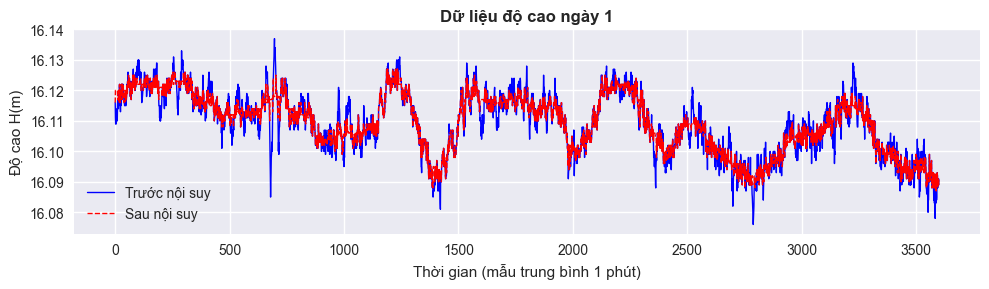

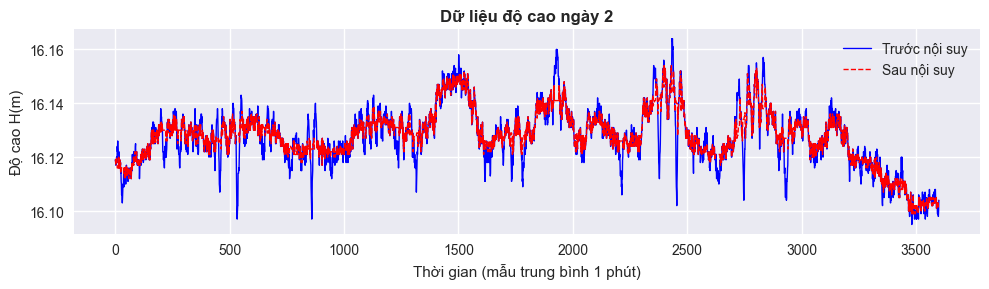

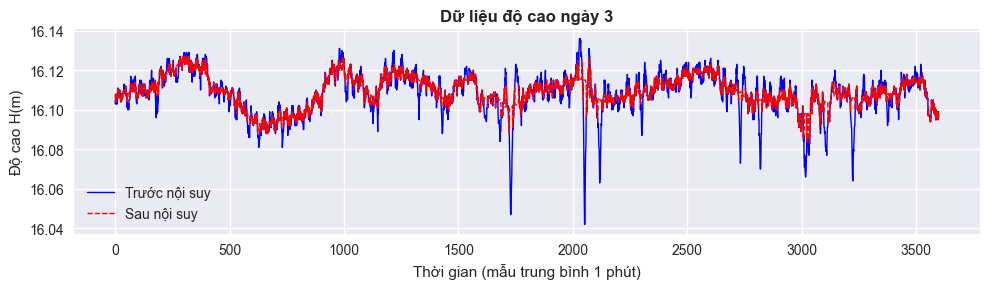

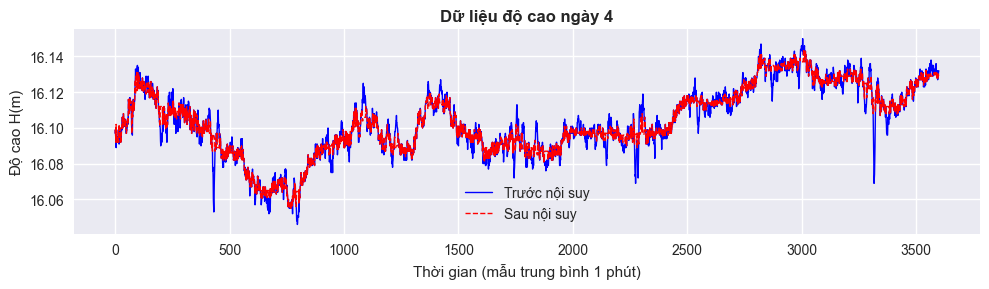

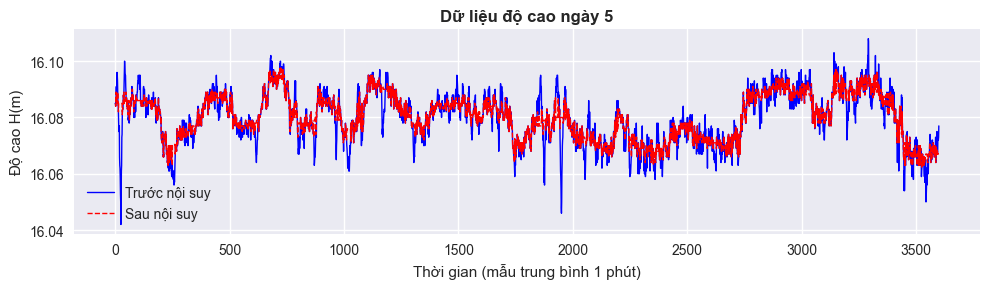

...

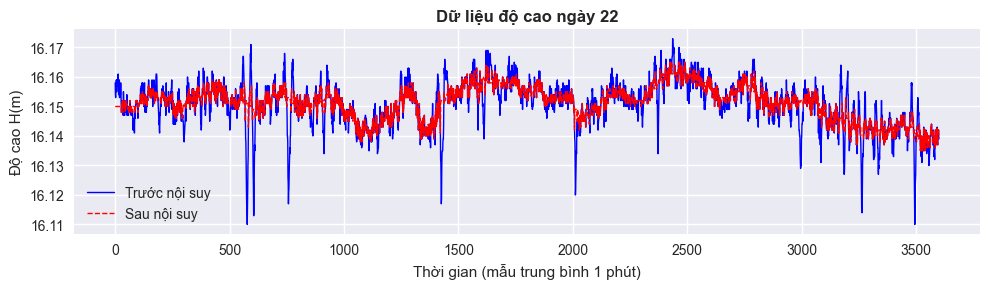

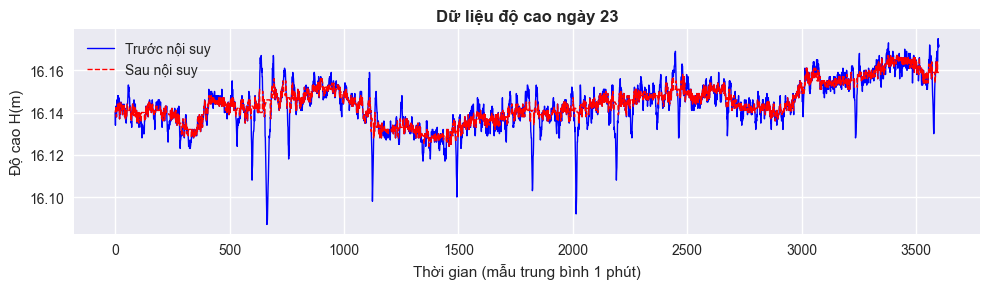

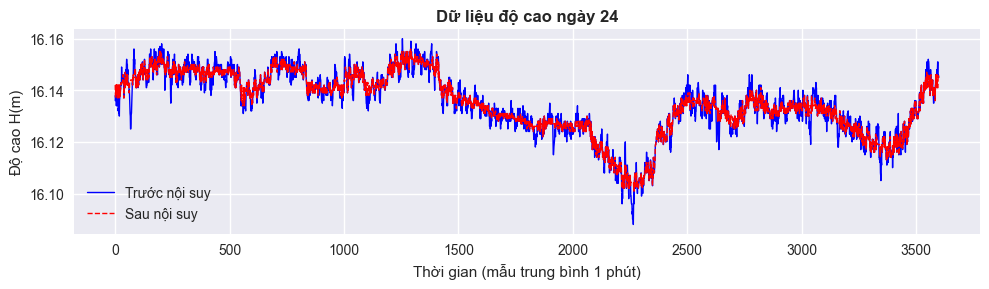

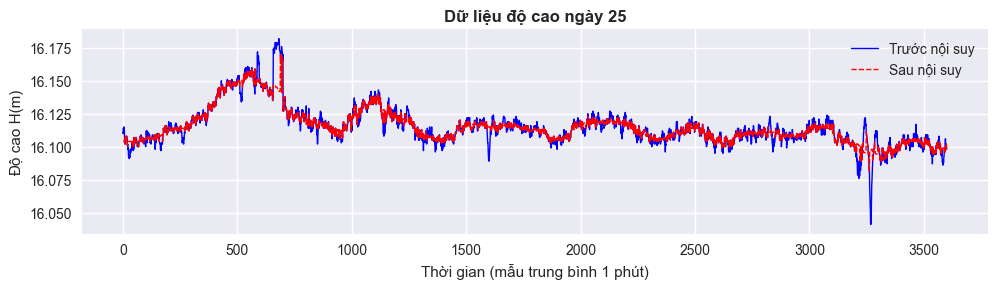

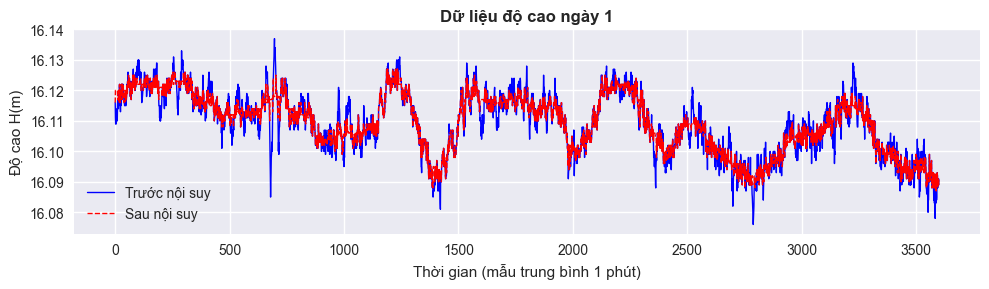

In [45]:
for i in range(20):
    import matplotlib.pyplot as plt

import matplotlib.pyplot as plt

# Hàm vẽ từng ngày
def plot_z_interpolation(original_z, interpolated_z, day_index):
    plt.figure(figsize=(10, 3))

    # Trước nội suy - màu xanh
    plt.plot(original_z, label='Trước nội suy', color='blue', linewidth=1)

    # Sau nội suy - màu đỏ, nét đứt
    plt.plot(interpolated_z, label='Sau nội suy', color='red', linestyle='--', linewidth=1)

    plt.title(f'Dữ liệu độ cao ngày {day_index+1}', fontsize=12, fontweight='bold')
    plt.xlabel('Thời gian (mẫu trung bình 1 phút)')
    plt.ylabel('Độ cao H(m)')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# Vẽ cho toàn bộ 25 ngày đầu tiên
for i in range(25):
    plot_z_interpolation(hourly_matrix[i], hampel_data[i], i)


# Gọi hàm vẽ cho 1 ngày cụ thể (ví dụ i = 0 là ngày đầu)
i = 0  # hoặc bất kỳ ngày nào từ 0 đến 24
plot_z_interpolation(hourly_matrix[i], hampel_data[i], i)


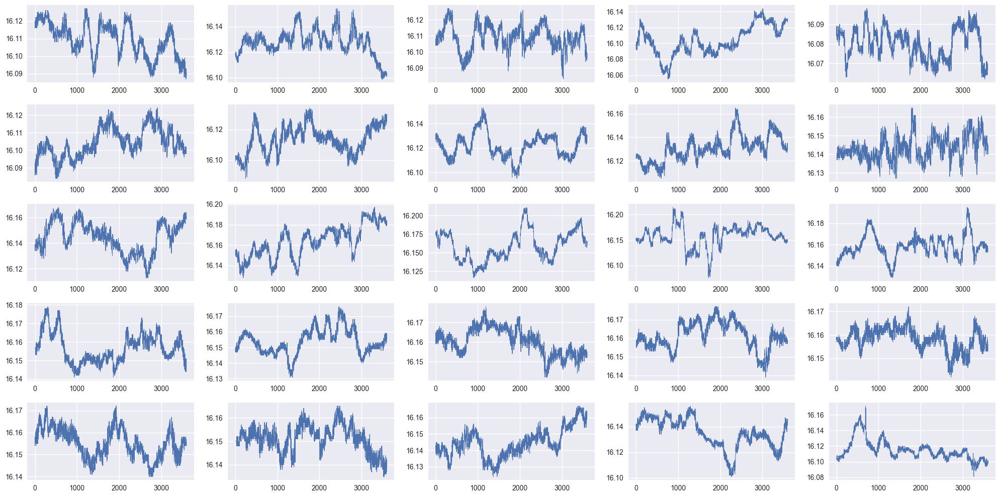

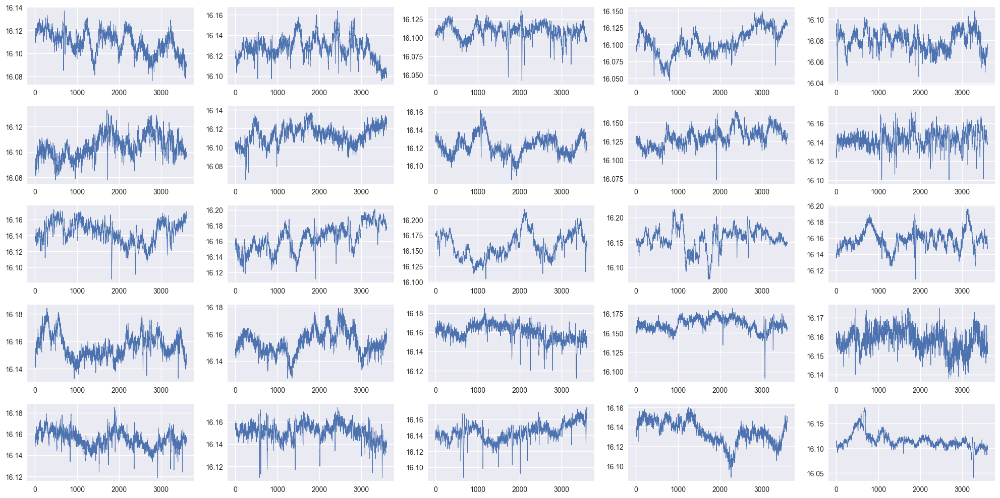

In [23]:
plot_multiple_series(hampel_data[:25], n_cols=5, figsize=(20, 2))
plot_multiple_series(hourly_matrix[:25], n_cols=5, figsize=(20, 2))

#### <a> 3.2 Giảm chiều dữ liệu bằng trung bình động </a>

In [24]:
import numpy as np
 
# Xác định kích thước cửa sổ
window_size = 10

# Tạo một mảng trống để lưu trữ dữ liệu sau khi áp dụng trung bình động
reshape_data = []

# Áp dụng trung bình động cho mỗi dòng dữ liệu
for row in hampel_data:
    # Chia thành các cửa sổ, tính trung bình cho mỗi cửa sổ
    new_row = np.mean(row.reshape(-1, window_size), axis=1)
    reshape_data.append(new_row)

# Chuyển kết quả thành mảng numpy với kích thước (25, 5000)
reshape_data = np.array(reshape_data)

print(reshape_data.shape)  # Kiểm tra kích thước của dữ liệu mới (25, 5000)

(191, 360)


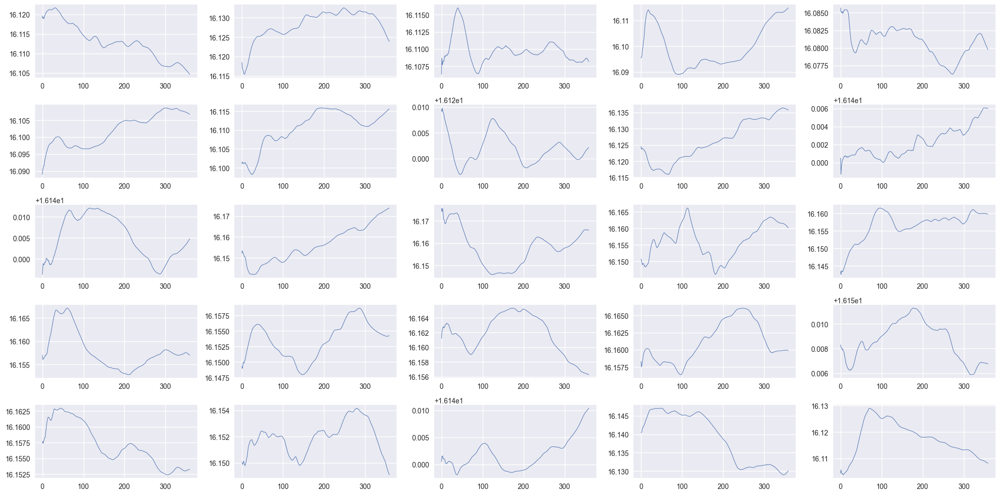

In [25]:
data_filtered = kalman_filter_2d(reshape_data)
plot_multiple_series(data_filtered[:25], n_cols=5, figsize=(20, 2))

### <a> 4. Phân cụm dữ liệu </a>

**ĐỀ XUẤT 4 THUẬT TOÁN PHÂN CỤM CHO DỮ LIỆU GNSS**

Dựa trên đặc tính của dữ liệu GNSS chuỗi thời gian và sau khi áp dụng **Butterworth filter**, tôi đề xuất 4 thuật toán phân cụm sau:
**2. Hierarchical Agglomerative Clustering (HAC)**
- **Ưu điểm**: Không cần định trước số cụm, tạo dendrogram để chọn số cụm tối ưu
- **Phù hợp**: Khám phá cấu trúc phân cấp trong dữ liệu GNSS
- **Linkage**: Ward, Complete, Average

**3. DBSCAN (Density-based)**
- **Ưu điểm**: Tự động phát hiện outliers, không cần định trước số cụm
- **Phù hợp**: Dữ liệu GNSS có nhiễu và outliers
- **Parameters**: eps, min_samples cần được tuning

**4. Gaussian Mixture Model (GMM)**
- **Ưu điểm**: Soft clustering, ước lượng xác suất thuộc cụm
- **Phù hợp**: Dữ liệu GNSS có phân phối Gaussian, overlap giữa các cụm
- **Flexible**: Có thể handle elliptical clusters

#### <a> 4.1 Chuẩn bị dữ liệu </a>

Chuẩn hóa dữ liệu

In [26]:
# Chuẩn hóa dữ liệu
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data_filtered.T).T
print(f"Đã chuẩn hóa dữ liệu")

Đã chuẩn hóa dữ liệu


PCA

In [27]:

# Giảm chiều dữ liệu để visualization 2D
print("   Đang giảm chiều dữ liệu bằng PCA...")
pca = PCA(n_components=50, random_state=42)
data_pca = pca.fit_transform(data_scaled)

   Đang giảm chiều dữ liệu bằng PCA...


t - SNE

In [28]:
tsne = TSNE(
    n_components=2,
    init='pca', 
    random_state=SEED,
    perplexity=min(30, len(data_scaled)-1),  # Ensure perplexity < n_samples
    # n_iter=1000,  # Increase iterations for better convergence
    learning_rate=20,  # Use adaptive learning rate 281 is a good default for t-SNE
    early_exaggeration=12,  # Better separation in early stages
    metric='l1'  # Use Manhattan distance for better clustering
)
data_tsne = tsne.fit_transform(data_scaled)
data_tsne = tsne.fit_transform(data_tsne)

#### <a> 4.2 Timeseries_kmeans

In [29]:
def run_timeseries_kmeans(data, n_clusters=8, metric="dtw", max_iter=20, random_state=42, n_jobs=1):
    """
    Thực hiện TimeSeriesKMeans clustering (DTW) và trả về kết quả metrics.
    Nếu lỗi sẽ fallback sang KMeans thông thường.

    Parameters:
    - data: ndarray, dữ liệu đầu vào (n_samples, n_features)
    - n_clusters: int, số cụm
    - metric: str, metric cho TimeSeriesKMeans ("dtw" hoặc "euclidean")
    - max_iter: int, số vòng lặp tối đa
    - random_state: int, seed
    - n_jobs: int, số luồng

    Returns:
    - result: dict chứa labels và các metrics
    - method_name: tên thuật toán sử dụng
    """
    print("\nTIMESERIES K-MEANS (DTW)")
    print("-" * 40)
    try:
        from tslearn.clustering import TimeSeriesKMeans

        ts_kmeans = TimeSeriesKMeans(
            n_clusters=n_clusters, 
            metric=metric,
            max_iter=max_iter,
            random_state=random_state,
            n_jobs=n_jobs
        )

        labels_ts = ts_kmeans.fit_predict(data)

        # Tính metrics trên dữ liệu đã chuẩn hóa (data_scaled)
        silhouette_ts = silhouette_score(data_scaled, labels_ts)
        calinski_ts = calinski_harabasz_score(data_scaled, labels_ts)
        davies_ts = davies_bouldin_score(data_scaled, labels_ts)

        result = {
            'labels': labels_ts,
            'silhouette': silhouette_ts,
            'calinski_harabasz': calinski_ts,
            'davies_bouldin': davies_ts,
            'n_clusters': len(np.unique(labels_ts))
        }
        print(f"Hoàn thành! Silhouette Score: {silhouette_ts:.3f}")
        print(f"   Số cụm tìm được: {len(np.unique(labels_ts))}")
        return result, "TimeSeriesKMeans"
    except Exception as e:
        print(f"Lỗi TimeSeriesKMeans: {e}")
        print("   Sẽ sử dụng KMeans thông thường thay thế")
        from sklearn.cluster import KMeans
        kmeans_alt = KMeans(n_clusters=n_clusters, random_state=random_state)
        labels_alt = kmeans_alt.fit_predict(data_scaled)
        result = {
            'labels': labels_alt,
            'silhouette': silhouette_score(data_scaled, labels_alt),
            'calinski_harabasz': calinski_harabasz_score(data_scaled, labels_alt),
            'davies_bouldin': davies_bouldin_score(data_scaled, labels_alt),
            'n_clusters': len(np.unique(labels_alt))
        }
        return result, "KMeans_Alternative"

#### <a> 4.3 Hierarchical_clustering </a>

In [30]:
def run_hierarchical_clustering(data, n_clusters=8, linkage='ward'):
    """
    Thực hiện Hierarchical Agglomerative Clustering và trả về kết quả metrics.

    Parameters:
    - data: ndarray, dữ liệu đầu vào (n_samples, n_features)
    - n_clusters: int, số cụm
    - linkage: str, phương pháp liên kết ('ward', 'complete', 'average', 'single')

    Returns:
    - result: dict chứa labels và các metrics
    """
    print("\n2.HIERARCHICAL AGGLOMERATIVE CLUSTERING")
    print("-" * 40)
    try:
        hac = AgglomerativeClustering(
            n_clusters=n_clusters,
            linkage=linkage
        )
        labels_hac = hac.fit_predict(data)
        silhouette_hac = silhouette_score(data, labels_hac)
        calinski_hac = calinski_harabasz_score(data, labels_hac)
        davies_hac = davies_bouldin_score(data, labels_hac)

        result = {
            'labels': labels_hac,
            'silhouette': silhouette_hac,
            'calinski_harabasz': calinski_hac,
            'davies_bouldin': davies_hac,
            'n_clusters': len(np.unique(labels_hac))
        }
        print(f"Hoàn thành! Silhouette Score: {silhouette_hac:.3f}")
        print(f"   Số cụm tìm được: {len(np.unique(labels_hac))}")
        return result
    except Exception as e:
        print(f"Lỗi HAC: {e}")
        return None

#### <a> 4.4 Dbscan

In [31]:
# 3. DBSCAN
def run_dbscan_clustering(data, min_samples=4, eps_percentile=90):
    """
    Thực hiện DBSCAN clustering với auto-tuning eps và trả về kết quả metrics.

    Parameters:
    - data: ndarray, dữ liệu đầu vào (n_samples, n_features)
    - min_samples: int, số điểm tối thiểu trong một cụm
    - eps_percentile: float, percentile để chọn eps tự động

    Returns:
    - result: dict chứa labels và các metrics
    """
    print("\n3. DBSCAN (DENSITY-BASED)")
    print("-" * 40)
    try:
        from sklearn.neighbors import NearestNeighbors
        
        # Tính khoảng cách đến k nearest neighbors
        nbrs = NearestNeighbors(n_neighbors=min_samples).fit(data)
        distances, indices = nbrs.kneighbors(data)
        
        # Sắp xếp khoảng cách và tìm elbow point
        distances = np.sort(distances[:, min_samples-1], axis=0)
        eps_auto = np.percentile(distances, eps_percentile)  # Sử dụng percentile
        
        dbscan = DBSCAN(
            eps=eps_auto,
            min_samples=min_samples
        )

        labels_dbscan = dbscan.fit_predict(data)

        # Kiểm tra nếu có ít nhất 2 cụm
        unique_labels = np.unique(labels_dbscan)
        n_clusters_dbscan = len(unique_labels[unique_labels != -1])  # Loại trừ noise (-1)
        
        if n_clusters_dbscan > 1:
            # Loại bỏ noise points cho việc tính metrics
            mask = labels_dbscan != -1
            if np.sum(mask) > 1:
                silhouette_dbscan = silhouette_score(data[mask], labels_dbscan[mask])
                calinski_dbscan = calinski_harabasz_score(data[mask], labels_dbscan[mask])
                davies_dbscan = davies_bouldin_score(data[mask], labels_dbscan[mask])
            else:
                silhouette_dbscan = calinski_dbscan = davies_dbscan = -1
        else:
            silhouette_dbscan = calinski_dbscan = davies_dbscan = -1
        
        result = {
            'labels': labels_dbscan,
            'silhouette': silhouette_dbscan,
            'calinski_harabasz': calinski_dbscan,
            'davies_bouldin': davies_dbscan,
            'n_clusters': n_clusters_dbscan,
            'n_noise': np.sum(labels_dbscan == -1),
            'eps': eps_auto
        }
        
        print(f"Hoàn thành! Eps: {eps_auto:.4f}")
        print(f"   Số cụm tìm được: {n_clusters_dbscan}")
        print(f"   Số điểm noise: {np.sum(labels_dbscan == -1)}")
        if silhouette_dbscan > -1:
            print(f"   Silhouette Score: {silhouette_dbscan:.3f}")
        
        return result
        
    except Exception as e:
        print(f"Lỗi DBSCAN: {e}")
        return None

#### <a> 4.5 GMM </a>

In [32]:
def run_gmm_clustering(data, n_clusters=8, random_state=42, max_iter=100):
    """
    Thực hiện Gaussian Mixture Model clustering và trả về kết quả metrics.

    Parameters:
    - data: ndarray, dữ liệu đầu vào (n_samples, n_features)
    - n_clusters: int, số cụm
    - random_state: int, seed cho reproducibility
    - max_iter: int, số vòng lặp tối đa

    Returns:
    - result: dict chứa labels và các metrics
    """
    print("\n4. GAUSSIAN MIXTURE MODEL")
    print("-" * 40)
    try:
        gmm = GaussianMixture(
            n_components=n_clusters,
            covariance_type='full',
            random_state=random_state,
            max_iter=max_iter
        )
        gmm.fit(data)
        labels_gmm = gmm.predict(data)

        silhouette_gmm = silhouette_score(data, labels_gmm)
        calinski_gmm = calinski_harabasz_score(data, labels_gmm)
        davies_gmm = davies_bouldin_score(data, labels_gmm)

        result = {
            'labels': labels_gmm,
            'silhouette': silhouette_gmm,
            'calinski_harabasz': calinski_gmm,
            'davies_bouldin': davies_gmm,
            'n_clusters': len(np.unique(labels_gmm)),
            'aic': gmm.aic(data),
            'bic': gmm.bic(data),
            'log_likelihood': gmm.score(data)
        }

        print(f"Hoàn thành! Silhouette Score: {silhouette_gmm:.3f}")
        print(f"Số cụm tìm được: {len(np.unique(labels_gmm))}")
        print(f"AIC: {result['aic']:.2f}, BIC: {result['bic']:.2f}")

        return result

    except Exception as e:
        print(f"Lỗi GMM: {e}")
        return None

#### <a>4.6 Lựa chọn số cụm tối ưu

🚀 BẮT ĐẦU PHÂN TÍCH TỐI ƯU HÓA SỐ CỤM
🎯 TÌM KIẾM SỐ CỤM TỐI ƯU TOÀN DIỆN


Testing k values:   0%|          | 0/9 [00:00<?, ?it/s]


📊 Testing k = 2
----------------------------------------

TIMESERIES K-MEANS (DTW)
----------------------------------------


Testing k values:  11%|█         | 1/9 [00:04<00:37,  4.67s/it]

Hoàn thành! Silhouette Score: 0.321
   Số cụm tìm được: 2
   ✅ TimeSeriesKMeans: Sil=0.321

2.HIERARCHICAL AGGLOMERATIVE CLUSTERING
----------------------------------------
Hoàn thành! Silhouette Score: 0.478
   Số cụm tìm được: 2
   ✅ HAC: Sil=0.478

4. GAUSSIAN MIXTURE MODEL
----------------------------------------
Hoàn thành! Silhouette Score: 0.551
Số cụm tìm được: 2
AIC: 2335.62, BIC: 2371.39
   ✅ GMM: Sil=0.551

3. DBSCAN (DENSITY-BASED)
----------------------------------------
Hoàn thành! Eps: 1.2100
   Số cụm tìm được: 5
   Số điểm noise: 1
   Silhouette Score: 0.176
   ✅ DBSCAN: Found 5 clusters, Sil=0.176

📊 Testing k = 3
----------------------------------------

TIMESERIES K-MEANS (DTW)
----------------------------------------


Testing k values:  22%|██▏       | 2/9 [00:07<00:25,  3.58s/it]

Hoàn thành! Silhouette Score: 0.266
   Số cụm tìm được: 3
   ✅ TimeSeriesKMeans: Sil=0.266

2.HIERARCHICAL AGGLOMERATIVE CLUSTERING
----------------------------------------
Hoàn thành! Silhouette Score: 0.484
   Số cụm tìm được: 3
   ✅ HAC: Sil=0.484

4. GAUSSIAN MIXTURE MODEL
----------------------------------------
Hoàn thành! Silhouette Score: 0.505
Số cụm tìm được: 3
AIC: 2160.92, BIC: 2216.21
   ✅ GMM: Sil=0.505

📊 Testing k = 4
----------------------------------------

TIMESERIES K-MEANS (DTW)
----------------------------------------


Testing k values:  33%|███▎      | 3/9 [00:11<00:23,  3.91s/it]

Hoàn thành! Silhouette Score: 0.245
   Số cụm tìm được: 4
   ✅ TimeSeriesKMeans: Sil=0.245

2.HIERARCHICAL AGGLOMERATIVE CLUSTERING
----------------------------------------
Hoàn thành! Silhouette Score: 0.496
   Số cụm tìm được: 4
   ✅ HAC: Sil=0.496

4. GAUSSIAN MIXTURE MODEL
----------------------------------------
Hoàn thành! Silhouette Score: 0.548
Số cụm tìm được: 4
AIC: 2122.16, BIC: 2196.96
   ✅ GMM: Sil=0.548

📊 Testing k = 5
----------------------------------------

TIMESERIES K-MEANS (DTW)
----------------------------------------


Testing k values:  44%|████▍     | 4/9 [00:16<00:21,  4.28s/it]

Hoàn thành! Silhouette Score: 0.190
   Số cụm tìm được: 5
   ✅ TimeSeriesKMeans: Sil=0.190

2.HIERARCHICAL AGGLOMERATIVE CLUSTERING
----------------------------------------
Hoàn thành! Silhouette Score: 0.484
   Số cụm tìm được: 5
   ✅ HAC: Sil=0.484

4. GAUSSIAN MIXTURE MODEL
----------------------------------------
Hoàn thành! Silhouette Score: 0.474
Số cụm tìm được: 5
AIC: 2089.35, BIC: 2183.67
   ✅ GMM: Sil=0.474

📊 Testing k = 6
----------------------------------------

TIMESERIES K-MEANS (DTW)
----------------------------------------


Testing k values:  56%|█████▌    | 5/9 [00:20<00:16,  4.24s/it]

Hoàn thành! Silhouette Score: 0.188
   Số cụm tìm được: 6
   ✅ TimeSeriesKMeans: Sil=0.188

2.HIERARCHICAL AGGLOMERATIVE CLUSTERING
----------------------------------------
Hoàn thành! Silhouette Score: 0.511
   Số cụm tìm được: 6
   ✅ HAC: Sil=0.511

4. GAUSSIAN MIXTURE MODEL
----------------------------------------
Hoàn thành! Silhouette Score: 0.492
Số cụm tìm được: 6
AIC: 2053.68, BIC: 2167.51
   ✅ GMM: Sil=0.492

📊 Testing k = 7
----------------------------------------

TIMESERIES K-MEANS (DTW)
----------------------------------------


Testing k values:  67%|██████▋   | 6/9 [00:25<00:13,  4.47s/it]

Hoàn thành! Silhouette Score: 0.155
   Số cụm tìm được: 7
   ✅ TimeSeriesKMeans: Sil=0.155

2.HIERARCHICAL AGGLOMERATIVE CLUSTERING
----------------------------------------
Hoàn thành! Silhouette Score: 0.493
   Số cụm tìm được: 7
   ✅ HAC: Sil=0.493

4. GAUSSIAN MIXTURE MODEL
----------------------------------------
Hoàn thành! Silhouette Score: 0.444
Số cụm tìm được: 7
AIC: 2049.66, BIC: 2183.01
   ✅ GMM: Sil=0.444

📊 Testing k = 8
----------------------------------------

TIMESERIES K-MEANS (DTW)
----------------------------------------


Testing k values:  78%|███████▊  | 7/9 [00:33<00:11,  5.70s/it]

Hoàn thành! Silhouette Score: 0.166
   Số cụm tìm được: 8
   ✅ TimeSeriesKMeans: Sil=0.166

2.HIERARCHICAL AGGLOMERATIVE CLUSTERING
----------------------------------------
Hoàn thành! Silhouette Score: 0.448
   Số cụm tìm được: 8
   ✅ HAC: Sil=0.448

4. GAUSSIAN MIXTURE MODEL
----------------------------------------
Hoàn thành! Silhouette Score: 0.387
Số cụm tìm được: 8
AIC: 2017.01, BIC: 2169.87
   ✅ GMM: Sil=0.387

📊 Testing k = 9
----------------------------------------

TIMESERIES K-MEANS (DTW)
----------------------------------------


Testing k values:  89%|████████▉ | 8/9 [00:37<00:05,  5.17s/it]

Hoàn thành! Silhouette Score: 0.109
   Số cụm tìm được: 9
   ✅ TimeSeriesKMeans: Sil=0.109

2.HIERARCHICAL AGGLOMERATIVE CLUSTERING
----------------------------------------
Hoàn thành! Silhouette Score: 0.443
   Số cụm tìm được: 9
   ✅ HAC: Sil=0.443

4. GAUSSIAN MIXTURE MODEL
----------------------------------------
Hoàn thành! Silhouette Score: 0.416
Số cụm tìm được: 9
AIC: 2037.77, BIC: 2210.14
   ✅ GMM: Sil=0.416

📊 Testing k = 10
----------------------------------------

TIMESERIES K-MEANS (DTW)
----------------------------------------


Testing k values: 100%|██████████| 9/9 [00:43<00:00,  4.82s/it]

Hoàn thành! Silhouette Score: 0.108
   Số cụm tìm được: 10
   ✅ TimeSeriesKMeans: Sil=0.108

2.HIERARCHICAL AGGLOMERATIVE CLUSTERING
----------------------------------------
Hoàn thành! Silhouette Score: 0.439
   Số cụm tìm được: 10
   ✅ HAC: Sil=0.439

4. GAUSSIAN MIXTURE MODEL
----------------------------------------
Hoàn thành! Silhouette Score: 0.437
Số cụm tìm được: 10
AIC: 2040.52, BIC: 2232.40
   ✅ GMM: Sil=0.437

📈 PHÂN TÍCH KẾT QUẢ
VOTING RESULTS:
----------------------------------------
k=2: 4 votes từ ['timeseries_kmeans_best_silhouette_k', 'timeseries_kmeans_best_calinski_k', 'timeseries_kmeans_best_davies_k', 'gmm_best_silhouette_k']
k=5: 3 votes từ ['dbscan_best_silhouette_k', 'dbscan_best_calinski_k', 'dbscan_best_davies_k']
k=6: 2 votes từ ['hac_best_silhouette_k', 'hac_best_davies_k']
k=9: 1 votes từ ['hac_best_calinski_k']
k=10: 1 votes từ ['gmm_best_calinski_k']
k=4: 1 votes từ ['gmm_best_davies_k']

 K TỐI ƯU ĐỀ XUẤT: k = 2
   Được ủng hộ bởi 4 tiêu chí
   Các tiêu 

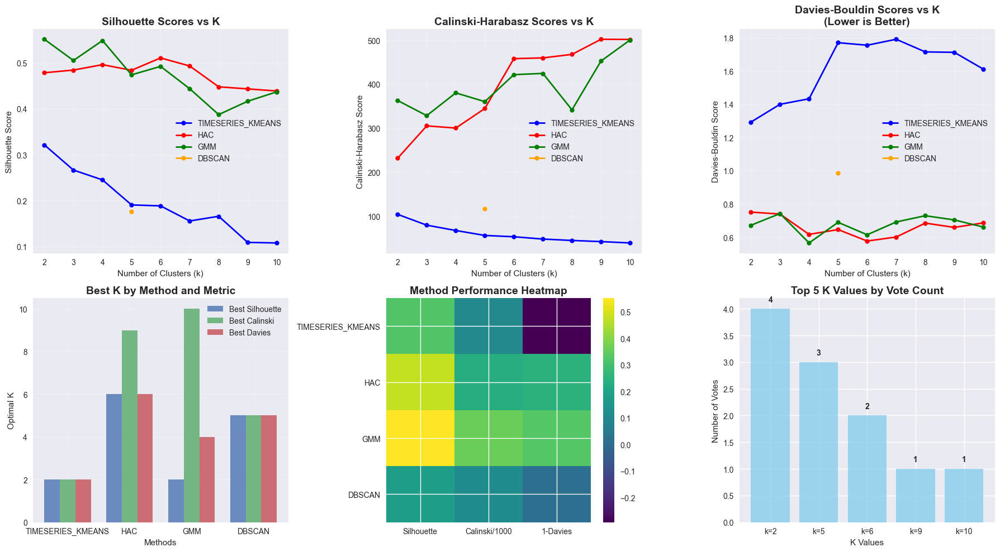


✅ HOÀN THÀNH PHÂN TÍCH!
💾 Kết quả lưu trong biến: optimization_result


In [33]:
def find_optimal_clusters_comprehensive(data, k_range=(2, 11), methods=['timeseries_kmeans', 'hac', 'dbscan', 'gmm']):
    """
    Tìm số cụm tối ưu bằng cách chạy tất cả thuật toán với nhiều giá trị k khác nhau
    và đánh giá dựa trên các chỉ số silhouette, calinski, davies
    
    Parameters:
    -----------
    data : numpy.ndarray
        Dữ liệu đã được tiền xử lý
    k_range : tuple
        Khoảng số cụm cần test (start, end)
    methods : list
        Danh sách thuật toán cần test
    
    Returns:
    --------
    dict: Kết quả phân tích và đề xuất k tối ưu
    """
    
    print("🎯 TÌM KIẾM SỐ CỤM TỐI ƯU TOÀN DIỆN")
    print("="*70)
    
    all_results = {}
    k_values = list(range(k_range[0], k_range[1]))
    
    # Lưu trữ kết quả từng method
    method_results = {
        'timeseries_kmeans': {'k_values': [], 'silhouette': [], 'calinski': [], 'davies': []},
        'hac': {'k_values': [], 'silhouette': [], 'calinski': [], 'davies': []},
        'gmm': {'k_values': [], 'silhouette': [], 'calinski': [], 'davies': []},
        'dbscan': {'k_values': [], 'silhouette': [], 'calinski': [], 'davies': []}
    }
    
    # Test từng giá trị k
    for k in tqdm(k_values, desc="Testing k values"):
        print(f"\n📊 Testing k = {k}")
        print("-" * 40)
        
        k_results = {}
        
        # 1. TimeSeriesKMeans
        if 'timeseries_kmeans' in methods:
            try:
                ts_result = run_timeseries_kmeans(data, n_clusters=k, metric="dtw", max_iter=20, random_state=42)
                if isinstance(ts_result, tuple):
                    ts_result = ts_result[0]
                
                if ts_result['silhouette'] > -1:
                    method_results['timeseries_kmeans']['k_values'].append(k)
                    method_results['timeseries_kmeans']['silhouette'].append(ts_result['silhouette'])
                    method_results['timeseries_kmeans']['calinski'].append(ts_result['calinski_harabasz'])
                    method_results['timeseries_kmeans']['davies'].append(ts_result['davies_bouldin'])
                    k_results['timeseries_kmeans'] = ts_result
                    print(f"   ✅ TimeSeriesKMeans: Sil={ts_result['silhouette']:.3f}")
                else:
                    print(f"   ❌ TimeSeriesKMeans: Failed")
            except Exception as e:
                print(f"   ❌ TimeSeriesKMeans: Error - {str(e)[:50]}")
        
        # 2. Hierarchical Agglomerative Clustering
        if 'hac' in methods:
            try:
                hac_result = run_hierarchical_clustering(data, n_clusters=k, linkage='ward')
                if hac_result and hac_result['silhouette'] > -1:
                    method_results['hac']['k_values'].append(k)
                    method_results['hac']['silhouette'].append(hac_result['silhouette'])
                    method_results['hac']['calinski'].append(hac_result['calinski_harabasz'])
                    method_results['hac']['davies'].append(hac_result['davies_bouldin'])
                    k_results['hac'] = hac_result
                    print(f"   ✅ HAC: Sil={hac_result['silhouette']:.3f}")
                else:
                    print(f"   ❌ HAC: Failed")
            except Exception as e:
                print(f"   ❌ HAC: Error - {str(e)[:50]}")
        
        # 3. Gaussian Mixture Model
        if 'gmm' in methods:
            try:
                gmm_result = run_gmm_clustering(data, n_clusters=k)
                if gmm_result and gmm_result['silhouette'] > -1:
                    method_results['gmm']['k_values'].append(k)
                    method_results['gmm']['silhouette'].append(gmm_result['silhouette'])
                    method_results['gmm']['calinski'].append(gmm_result['calinski_harabasz'])
                    method_results['gmm']['davies'].append(gmm_result['davies_bouldin'])
                    k_results['gmm'] = gmm_result
                    print(f"   ✅ GMM: Sil={gmm_result['silhouette']:.3f}")
                else:
                    print(f"   ❌ GMM: Failed")
            except Exception as e:
                print(f"   ❌ GMM: Error - {str(e)[:50]}")
        
        # 4. DBSCAN (chỉ chạy một lần vì không phụ thuộc vào k)
        if 'dbscan' in methods and k == k_values[0]:
            try:
                dbscan_result = run_dbscan_clustering(data, min_samples=4, eps_percentile=90)
                if dbscan_result and dbscan_result['silhouette'] > -1:
                    actual_k = dbscan_result['n_clusters']
                    if actual_k > 1:
                        method_results['dbscan']['k_values'].append(actual_k)
                        method_results['dbscan']['silhouette'].append(dbscan_result['silhouette'])
                        method_results['dbscan']['calinski'].append(dbscan_result['calinski_harabasz'])
                        method_results['dbscan']['davies'].append(dbscan_result['davies_bouldin'])
                        k_results['dbscan'] = dbscan_result
                        print(f"   ✅ DBSCAN: Found {actual_k} clusters, Sil={dbscan_result['silhouette']:.3f}")
                    else:
                        print(f"   ❌ DBSCAN: Only found {actual_k} cluster(s)")
                else:
                    print(f"   ❌ DBSCAN: Failed")
            except Exception as e:
                print(f"   ❌ DBSCAN: Error - {str(e)[:50]}")
        
        all_results[k] = k_results
    
    # Phân tích kết quả và tìm k tối ưu
    print(f"\n📈 PHÂN TÍCH KẾT QUẢ")
    print("="*70)
    
    # Tìm k tốt nhất cho từng method dựa trên từng metric
    best_k_by_method = {}
    
    for method, results in method_results.items():
        if len(results['k_values']) > 0:
            best_k_by_method[method] = {
                'best_silhouette_k': results['k_values'][np.argmax(results['silhouette'])],
                'best_calinski_k': results['k_values'][np.argmax(results['calinski'])],
                'best_davies_k': results['k_values'][np.argmin(results['davies'])],
                'silhouette_scores': results['silhouette'],
                'calinski_scores': results['calinski'],
                'davies_scores': results['davies'],
                'k_values': results['k_values']
            }
    
    # Voting system - đếm votes cho từng k
    k_votes = {}
    for method, best_ks in best_k_by_method.items():
        for metric, k_val in best_ks.items():
            if metric.endswith('_k'):
                if k_val not in k_votes:
                    k_votes[k_val] = []
                k_votes[k_val].append(f"{method}_{metric}")
    
    # Sắp xếp theo số votes
    sorted_votes = sorted(k_votes.items(), key=lambda x: len(x[1]), reverse=True)
    
    print("VOTING RESULTS:")
    print("-" * 40)
    for k, votes in sorted_votes:
        print(f"k={k}: {len(votes)} votes từ {votes}")
    
    # K được đề xuất nhiều nhất
    if sorted_votes:
        recommended_k = sorted_votes[0][0]
        vote_count = len(sorted_votes[0][1])
        
        print(f"\n K TỐI ƯU ĐỀ XUẤT: k = {recommended_k}")
        print(f"   Được ủng hộ bởi {vote_count} tiêu chí")
        print(f"   Các tiêu chí ủng hộ: {sorted_votes[0][1]}")
        
        # Tính composite score cho k được đề xuất
        if recommended_k in all_results and len(all_results[recommended_k]) > 0:
            print(f"\nCHI TIẾT PERFORMANCE CHO k={recommended_k}:")
            print("-" * 50)
            
            for method, result in all_results[recommended_k].items():
                if result:
                    print(f"{method.upper()}:")
                    print(f"  • Silhouette: {result['silhouette']:.4f}")
                    print(f"  • Calinski-Harabasz: {result['calinski_harabasz']:.2f}")
                    print(f"  • Davies-Bouldin: {result['davies_bouldin']:.4f}")
                    if 'n_clusters' in result:
                        print(f"  • Số cụm tìm được: {result['n_clusters']}")
                    print()
    
    # Tạo visualization
    create_optimization_plots(method_results, best_k_by_method, recommended_k if sorted_votes else None, sorted_votes)
    
    # Trả về kết quả
    optimization_result = {
        'recommended_k': recommended_k if sorted_votes else None,
        'vote_count': vote_count if sorted_votes else 0,
        'voting_details': sorted_votes,
        'method_results': method_results,
        'best_k_by_method': best_k_by_method,
        'all_results': all_results,
        'tested_range': k_range,
        'methods_tested': methods
    }
    
    return optimization_result

def create_optimization_plots(method_results, best_k_by_method, recommended_k, voting_details=None):
    """
    Tạo biểu đồ visualization cho kết quả optimization
    """
    print(f"\nTẠO BIỂU ĐỒ VISUALIZATION")
    print("-" * 40)
    
    fig, axes = plt.subplots(2, 3, figsize=(18, 10))
    
    colors = ['blue', 'red', 'green', 'orange']
    method_names = ['timeseries_kmeans', 'hac', 'gmm', 'dbscan']
    
    # 1. Silhouette Scores
    ax = axes[0, 0]
    for i, method in enumerate(method_names):
        if method in method_results and len(method_results[method]['k_values']) > 0:
            ax.plot(method_results[method]['k_values'], 
                   method_results[method]['silhouette'], 
                   'o-', color=colors[i], label=method.upper(), linewidth=2, markersize=6)
    
    # if recommended_k:
    #     ax.axvline(x=recommended_k, color='red', linestyle='--', linewidth=2, alpha=0.7, label=f'Recommended k={recommended_k}')
    
    ax.set_title('Silhouette Scores vs K', fontsize=14, fontweight='bold')
    ax.set_xlabel('Number of Clusters (k)')
    ax.set_ylabel('Silhouette Score')
    ax.legend()
    ax.grid(True, alpha=0.3)
    
    # 2. Calinski-Harabasz Scores
    ax = axes[0, 1]
    for i, method in enumerate(method_names):
        if method in method_results and len(method_results[method]['k_values']) > 0:
            ax.plot(method_results[method]['k_values'], 
                   method_results[method]['calinski'], 
                   'o-', color=colors[i], label=method.upper(), linewidth=2, markersize=6)

    ax.set_title('Calinski-Harabasz Scores vs K', fontsize=14, fontweight='bold')
    ax.set_xlabel('Number of Clusters (k)')
    ax.set_ylabel('Calinski-Harabasz Score')
    ax.legend()
    ax.grid(True, alpha=0.3)
    
    # 3. Davies-Bouldin Scores
    ax = axes[0, 2]
    for i, method in enumerate(method_names):
        if method in method_results and len(method_results[method]['k_values']) > 0:
            ax.plot(method_results[method]['k_values'], 
                   method_results[method]['davies'], 
                   'o-', color=colors[i], label=method.upper(), linewidth=2, markersize=6)
    
    # if recommended_k:
    #     ax.axvline(x=recommended_k, color='red', linestyle='--', linewidth=2, alpha=0.7, label=f'Recommended k={recommended_k}')
    
    ax.set_title('Davies-Bouldin Scores vs K\n(Lower is Better)', fontsize=14, fontweight='bold')
    ax.set_xlabel('Number of Clusters (k)')
    ax.set_ylabel('Davies-Bouldin Score')
    ax.legend()
    ax.grid(True, alpha=0.3)
    
    # 4. Best K comparison
    ax = axes[1, 0]
    metrics = ['silhouette', 'calinski', 'davies']
    x_pos = np.arange(len(method_names))
    width = 0.25
    
    for i, metric in enumerate(metrics):
        best_ks = []
        for method in method_names:
            if method in best_k_by_method:
                best_ks.append(best_k_by_method[method][f'best_{metric}_k'])
            else:
                best_ks.append(0)
        
        ax.bar(x_pos + i*width, best_ks, width, label=f'Best {metric.capitalize()}', alpha=0.8)
    
    ax.set_title('Best K by Method and Metric', fontsize=14, fontweight='bold')
    ax.set_xlabel('Methods')
    ax.set_ylabel('Optimal K')
    ax.set_xticks(x_pos + width)
    ax.set_xticklabels([m.upper() for m in method_names])
    ax.legend()
    ax.grid(True, alpha=0.3)
    
    # 5. Method Performance Heatmap
    ax = axes[1, 1]
    
    # Tạo ma trận performance (normalized)
    performance_matrix = []
    method_labels = []
    
    for method in method_names:
        if method in method_results and len(method_results[method]['k_values']) > 0:
            # Lấy scores tại recommended_k nếu có
            if recommended_k and recommended_k in method_results[method]['k_values']:
                idx = method_results[method]['k_values'].index(recommended_k)
                sil_score = method_results[method]['silhouette'][idx]
                cal_score = method_results[method]['calinski'][idx] / 1000  # Normalize
                dav_score = 1 - method_results[method]['davies'][idx]  # Invert (lower is better)
            else:
                # Lấy best scores
                sil_score = max(method_results[method]['silhouette'])
                cal_score = max(method_results[method]['calinski']) / 1000
                dav_score = 1 - min(method_results[method]['davies'])
            
            performance_matrix.append([sil_score, cal_score, dav_score])
            method_labels.append(method.upper())
    
    if performance_matrix:
        im = ax.imshow(performance_matrix, cmap='viridis', aspect='auto')
        ax.set_xticks(range(3))
        ax.set_xticklabels(['Silhouette', 'Calinski/1000', '1-Davies'])
        ax.set_yticks(range(len(method_labels)))
        ax.set_yticklabels(method_labels)
        ax.set_title('Method Performance Heatmap', fontsize=14, fontweight='bold')
        plt.colorbar(im, ax=ax)
    
    # 6. Voting Results
    ax = axes[1, 2]
    if voting_details is not None and len(voting_details) > 0:
        k_vals = [item[0] for item in voting_details[:5]]  # Top 5
        vote_counts = [len(item[1]) for item in voting_details[:5]]
        
        bars = ax.bar(range(len(k_vals)), vote_counts, color='skyblue', alpha=0.8)
        ax.set_title('Top 5 K Values by Vote Count', fontsize=14, fontweight='bold')
        ax.set_xlabel('K Values')
        ax.set_ylabel('Number of Votes')
        ax.set_xticks(range(len(k_vals)))
        ax.set_xticklabels([f'k={k}' for k in k_vals])
        
        # Thêm số votes lên cột
        for bar, count in zip(bars, vote_counts):
            height = bar.get_height()
            ax.text(bar.get_x() + bar.get_width()/2., height + 0.1,
                   f'{count}', ha='center', va='bottom', fontweight='bold')
    else:
        ax.text(0.5, 0.5, 'No voting data available', ha='center', va='center', transform=ax.transAxes)
        ax.set_title('Voting Results', fontsize=14, fontweight='bold')
    
    plt.tight_layout()
    plt.show()

# Chạy phân tích tối ưu hóa số cụm
print("🚀 BẮT ĐẦU PHÂN TÍCH TỐI ƯU HÓA SỐ CỤM")
optimization_result = find_optimal_clusters_comprehensive(
    data_tsne, 
    k_range=(2, 11), 
    methods=['timeseries_kmeans', 'hac', 'gmm', 'dbscan']
)

print(f"\n✅ HOÀN THÀNH PHÂN TÍCH!")
print(f"💾 Kết quả lưu trong biến: optimization_result")

#### <a> 4.6 Run_analysic

In [34]:
clustering_results = {} 
n_clusters = 2 # Số cụm mặc định  


# Thực hiện TimeSeriesKMeans clustering
clustering_results['TimeSeriesKMeans'] = run_timeseries_kmeans(
    data_tsne,  
    n_clusters=n_clusters,
    metric="dtw",
    max_iter=20,
    random_state=42,
    n_jobs=1
)
# Thực hiện Hierarchical Agglomerative Clustering
clustering_results['HAC'] = run_hierarchical_clustering(
    data_tsne, 
    n_clusters=n_clusters,
    linkage='ward'
)
# Thực hiện Gaussian Mixture Model clustering
clustering_results['GMM'] = run_gmm_clustering(
    data_tsne, 
    n_clusters=n_clusters
)   
# Thực hiện DBSCAN clustering
clustering_results['DBSCAN'] = run_dbscan_clustering(
    data_tsne, 
    min_samples=4, 
    eps_percentile=90
)


TIMESERIES K-MEANS (DTW)
----------------------------------------
Hoàn thành! Silhouette Score: 0.321
   Số cụm tìm được: 2

2.HIERARCHICAL AGGLOMERATIVE CLUSTERING
----------------------------------------
Hoàn thành! Silhouette Score: 0.478
   Số cụm tìm được: 2

4. GAUSSIAN MIXTURE MODEL
----------------------------------------
Hoàn thành! Silhouette Score: 0.551
Số cụm tìm được: 2
AIC: 2335.62, BIC: 2371.39

3. DBSCAN (DENSITY-BASED)
----------------------------------------
Hoàn thành! Eps: 1.2100
   Số cụm tìm được: 5
   Số điểm noise: 1
   Silhouette Score: 0.176


In [35]:
#  Chuẩn hóa toàn bộ clustering_results thành dict
for k in clustering_results:
    if isinstance(clustering_results[k], tuple):
        clustering_results[k] = clustering_results[k][0]

SO SÁNH KẾT QUẢ 4 THUẬT TOÁN PHÂN CỤM

In [36]:
# Tạo bảng so sánh
comparison_data = []
for method, results in clustering_results.items():
    comparison_data.append({
        'Thuật toán': method,
        'Số cụm': results['n_clusters'],
        'Silhouette Score': f"{results['silhouette']:.4f}",
        'Calinski-Harabasz': f"{results['calinski_harabasz']:.2f}",
        'Davies-Bouldin': f"{results['davies_bouldin']:.4f}"
    })

comparison_df = pd.DataFrame(comparison_data)
print("BẢNG SO SÁNH METRICS:")
print(comparison_df.to_string(index=False))


BẢNG SO SÁNH METRICS:
      Thuật toán  Số cụm Silhouette Score Calinski-Harabasz Davies-Bouldin
TimeSeriesKMeans       2           0.3212            103.91         1.2931
             HAC       2           0.4783            231.72         0.7513
             GMM       2           0.5512            362.94         0.6724
          DBSCAN       5           0.1762            116.88         0.9855


In [37]:
def plot_clustering_results(clustering_results, data_2d):
    import matplotlib.pyplot as plt

    n_methods = len(clustering_results)
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    axes = axes.flatten()

    colors = ['red', 'blue', 'green', 'orange', 'purple', 'brown', 'pink', 'gray']

    for idx, (method, results) in enumerate(clustering_results.items()):
        if idx >= 4:  # Chỉ vẽ tối đa 4 methods
            break

        ax = axes[idx]
        labels = results['labels']

        unique_labels = np.unique(labels)

        for i, label in enumerate(unique_labels):
            mask = labels == label
            if label == -1:  # Noise points trong DBSCAN
                ax.scatter(data_2d[mask, 0], data_2d[mask, 1],
                          c='black', marker='x', s=50, alpha=0.6, label='Noise')
            else:
                ax.scatter(data_2d[mask, 0], data_2d[mask, 1],
                          c=colors[i % len(colors)], s=60, alpha=0.7,
                          label=f'Cluster {label}')

        ax.set_title(f'{method}\nSilhouette: {results["silhouette"]:.3f}',
                    fontweight='bold', fontsize=12)
        ax.set_xlabel('t-SNE Component 1')
        ax.set_ylabel('t-SNE Component 2')
        ax.legend(fontsize=9, loc='upper right')
        ax.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

    # Vẽ biểu đồ so sánh metrics
    print(f"\n📊 BIỂU ĐỒ SO SÁNH METRICS")

    fig, axes = plt.subplots(1, 3, figsize=(18, 5))

    methods = list(clustering_results.keys())
    silhouette_scores = [clustering_results[m]['silhouette'] for m in methods]
    calinski_scores = [clustering_results[m]['calinski_harabasz'] for m in methods]
    davies_scores = [clustering_results[m]['davies_bouldin'] for m in methods]

    # Silhouette Score (càng cao càng tốt)
    bars1 = axes[0].bar(methods, silhouette_scores, color='skyblue', alpha=0.8)
    axes[0].set_title('Silhouette Score\n(Càng cao càng tốt)', fontweight='bold')
    axes[0].set_ylabel('Score')
    axes[0].tick_params(axis='x', rotation=45)
    axes[0].grid(True, alpha=0.3)

    for bar, score in zip(bars1, silhouette_scores):
        height = bar.get_height()
        axes[0].text(bar.get_x() + bar.get_width()/2., height + 0.01,
                    f'{score:.3f}', ha='center', va='bottom', fontweight='bold')

    # Calinski-Harabasz Score (càng cao càng tốt)
    bars2 = axes[1].bar(methods, calinski_scores, color='lightgreen', alpha=0.8)
    axes[1].set_title('Calinski-Harabasz Score\n(Càng cao càng tốt)', fontweight='bold')
    axes[1].set_ylabel('Score')
    axes[1].tick_params(axis='x', rotation=45)
    axes[1].grid(True, alpha=0.3)

    # Davies-Bouldin Score (càng thấp càng tốt)
    bars3 = axes[2].bar(methods, davies_scores, color='salmon', alpha=0.8)
    axes[2].set_title('Davies-Bouldin Score\n(Càng thấp càng tốt)', fontweight='bold')
    axes[2].set_ylabel('Score')
    axes[2].tick_params(axis='x', rotation=45)
    axes[2].grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

    # Tìm thuật toán tốt nhất
    print(f"\n🏆 THUẬT TOÁN TỐT NHẤT:")
    best_silhouette = max(clustering_results.items(), key=lambda x: x[1]['silhouette'])
    best_calinski = max(clustering_results.items(), key=lambda x: x[1]['calinski_harabasz'])
    best_davies = min(clustering_results.items(), key=lambda x: x[1]['davies_bouldin'])

    print(f"   🥇 Silhouette Score cao nhất: {best_silhouette[0]} ({best_silhouette[1]['silhouette']:.4f})")
    print(f"   🥇 Calinski-Harabasz cao nhất: {best_calinski[0]} ({best_calinski[1]['calinski_harabasz']:.2f})")
    print(f"   🥇 Davies-Bouldin thấp nhất: {best_davies[0]} ({best_davies[1]['davies_bouldin']:.4f})")

    # Tính điểm tổng hợp (normalized)
    normalized_scores = {}
    for method in clustering_results.keys():
        sil_norm = clustering_results[method]['silhouette']
        cal_norm = clustering_results[method]['calinski_harabasz'] / max(calinski_scores)
        dav_norm = 1 - (clustering_results[method]['davies_bouldin'] / max(davies_scores))
        overall_score = (sil_norm * 0.4 + cal_norm * 0.3 + dav_norm * 0.3)
        normalized_scores[method] = overall_score

    best_overall = max(normalized_scores.items(), key=lambda x: x[1])
    print(f"\n🎯 THUẬT TOÁN TỐT NHẤT TỔNG HỢP: {best_overall[0]} (Score: {best_overall[1]:.4f})")

    # Lưu kết quả tốt nhất
    best_method = best_overall[0]
    best_labels = clustering_results[best_method]['labels']
    print(f"   ✅ Lưu nhãn phân cụm tốt nhất vào biến 'best_clustering_labels'")
    return best_labels


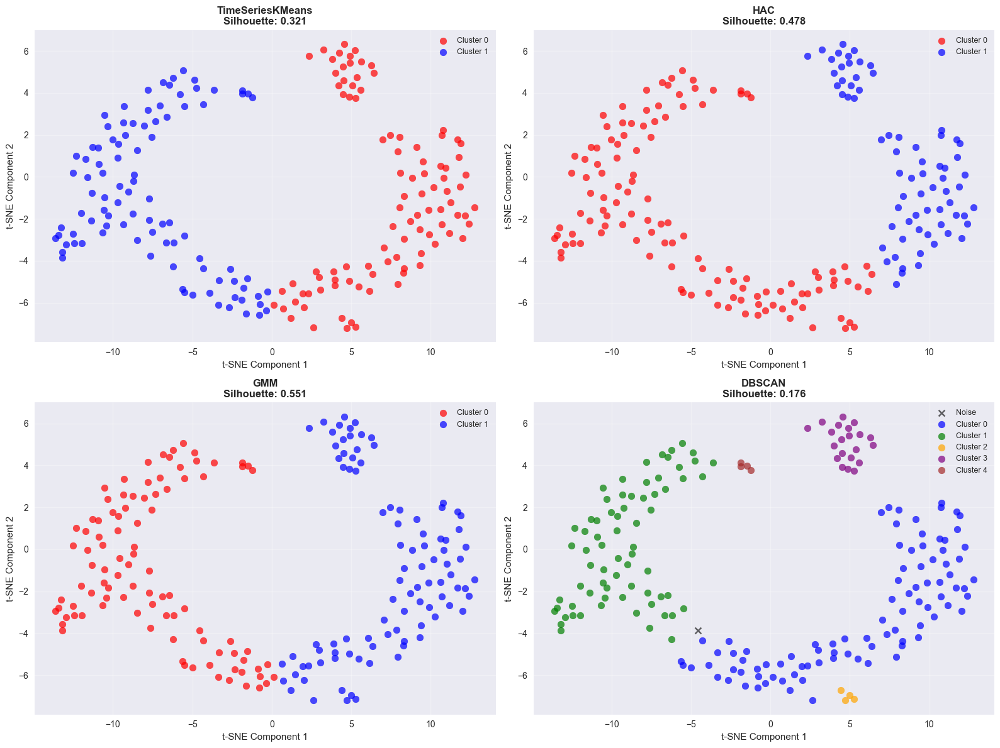


📊 BIỂU ĐỒ SO SÁNH METRICS


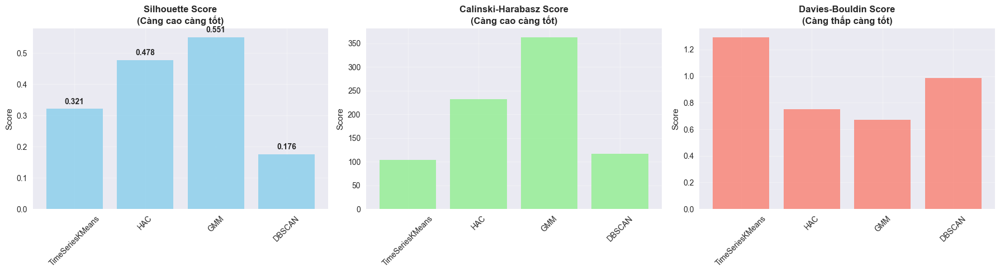


🏆 THUẬT TOÁN TỐT NHẤT:
   🥇 Silhouette Score cao nhất: GMM (0.5512)
   🥇 Calinski-Harabasz cao nhất: GMM (362.94)
   🥇 Davies-Bouldin thấp nhất: GMM (0.6724)

🎯 THUẬT TOÁN TỐT NHẤT TỔNG HỢP: GMM (Score: 0.6645)
   ✅ Lưu nhãn phân cụm tốt nhất vào biến 'best_clustering_labels'


array([1, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0,
       0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 1,
       0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1,
       1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 0,
       1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0,
       1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1, 0,
       0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1,
       1, 1, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1,
       0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1], dtype=int64)

In [38]:
plot_clustering_results(clustering_results, data_tsne)

#### <a> 4.7 Timeseries_line_plot

In [39]:
def plot_clusters_lineplot_all_methods(clustering_results, data_scaled):
    """
    Vẽ line plot từng cụm của từng phương pháp cho toàn bộ dữ liệu.
    """
    print(f"\n📈 LINE PLOT TỪNG CỤM CỦA TỪNG PHƯƠNG PHÁP - TOÀN BỘ {data_scaled.shape[0]} CHUỖI DỮ LIỆU")
    print("-"*70)

    display_data = data_scaled
    # Tạo time axis cho dữ liệu
    time_axis = np.arange(data_scaled.shape[1])

    for method_name, results in clustering_results.items():
        if results['silhouette'] == -1:
            continue

        labels = results['labels']
        unique_labels = np.unique(labels)
        n_clusters_method = len(unique_labels)

        fig, axes = plt.subplots(n_clusters_method, 1, figsize=(16, 4*n_clusters_method))
        if n_clusters_method == 1:
            axes = [axes]

        fig.suptitle(f'{method_name} - Phân Tích Từng Cụm (Toàn bộ {data_scaled.shape[0]} chuỗi)', 
                     fontsize=16, fontweight='bold', y=1)

        cluster_colors = plt.cm.Set3(np.linspace(0, 1, n_clusters_method))

        for i, cluster_id in enumerate(unique_labels):
            ax = axes[i]
            cluster_mask = labels == cluster_id
            cluster_indices = np.where(cluster_mask)[0]

            if len(cluster_indices) == 0:
                continue

            for idx in cluster_indices:
                series = display_data[idx, :]
                valid_mask = ~np.isnan(series)
                if np.sum(valid_mask) > 0:
                    ax.plot(time_axis[valid_mask], series[valid_mask], 
                            alpha=0.5, linewidth=0.5, color=cluster_colors[i])

            cluster_data = display_data[cluster_indices, :]
            cluster_mean = np.nanmean(cluster_data, axis=0)
            valid_mask = ~np.isnan(cluster_mean)

            if np.sum(valid_mask) > 0:
                ax.plot(time_axis[valid_mask], cluster_mean[valid_mask], 
                        color='black', linewidth=3, alpha=0.9, label='Cluster Mean')

            cluster_std = np.nanstd(cluster_data, axis=0)
            ax.fill_between(time_axis[valid_mask], 
                            (cluster_mean - cluster_std)[valid_mask],
                            (cluster_mean + cluster_std)[valid_mask],
                            alpha=0.2, color='gray', label='±1 Std Dev')

            cluster_label_text = f'Cluster {cluster_id}'
            if method_name == 'DBSCAN' and cluster_id == -1:
                cluster_label_text = 'Noise Points'

            ax.set_title(f'{cluster_label_text} ({len(cluster_indices)} chuỗi)', 
                         fontsize=12, fontweight='bold')
            ax.set_xlabel('Time Points', fontsize=10)
            ax.set_ylabel('Standardized Value', fontsize=10)
            ax.grid(True, alpha=0.3)
            ax.legend(loc='upper right', fontsize=9)

            stats_text = f'Mean: {np.nanmean(cluster_mean):.3f}\n'
            stats_text += f'Std: {np.nanmean(cluster_std):.3f}'
            ax.text(0.02, 0.98, stats_text, transform=ax.transAxes, 
                    verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.8),
                    fontsize=9)

        plt.tight_layout()
        plt.show()

        print(f"\n{method_name}:")
        for cluster_id in unique_labels:
            cluster_mask = labels == cluster_id
            count = np.sum(cluster_mask)
            cluster_label_text = f'Cluster {cluster_id}' if cluster_id != -1 else 'Noise'
            print(f"  • {cluster_label_text}: {count} chuỗi ({count/len(labels)*100:.1f}%)")

    print(f"\n✅ Hoàn thành visualization cho tất cả {len(clustering_results)} thuật toán với toàn bộ {data_scaled.shape[0]} chuỗi dữ liệu!")



📈 LINE PLOT TỪNG CỤM CỦA TỪNG PHƯƠNG PHÁP - TOÀN BỘ 191 CHUỖI DỮ LIỆU
----------------------------------------------------------------------


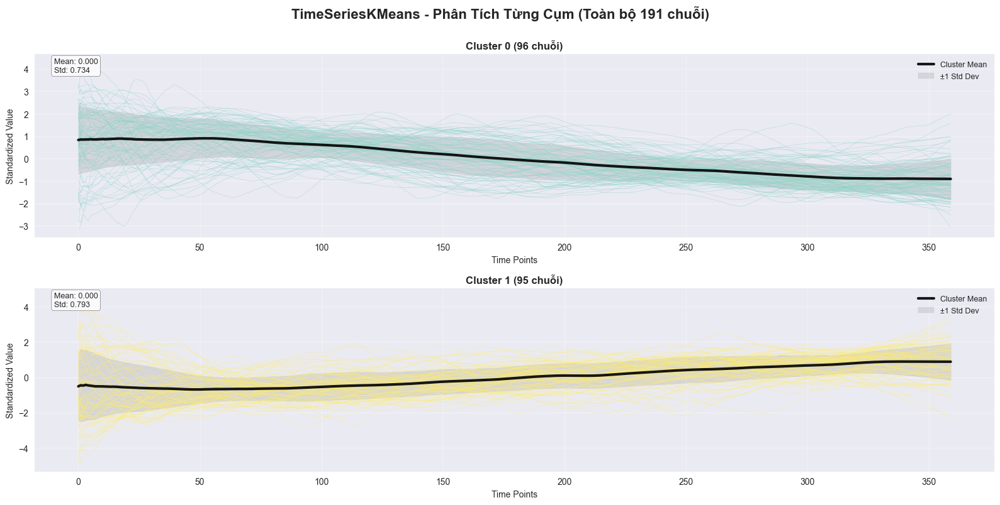


TimeSeriesKMeans:
  • Cluster 0: 96 chuỗi (50.3%)
  • Cluster 1: 95 chuỗi (49.7%)


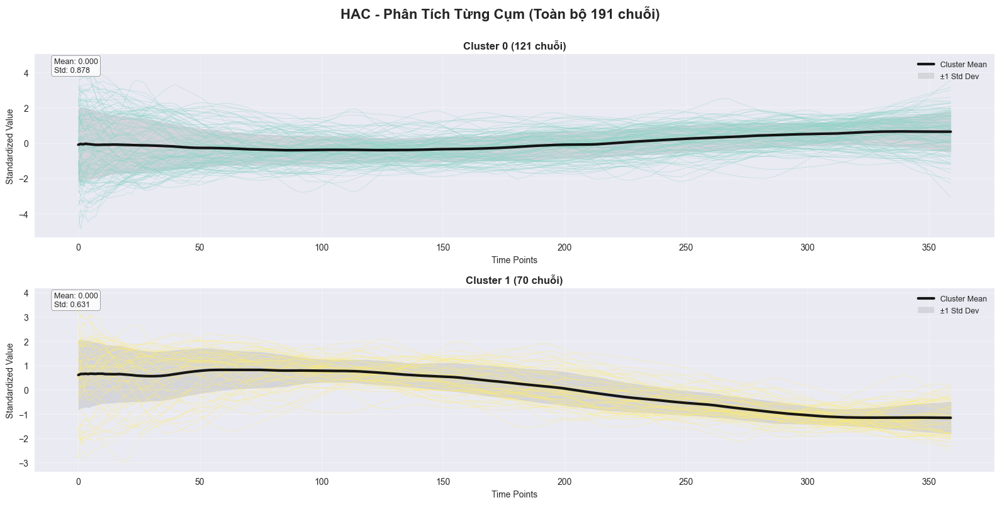


HAC:
  • Cluster 0: 121 chuỗi (63.4%)
  • Cluster 1: 70 chuỗi (36.6%)


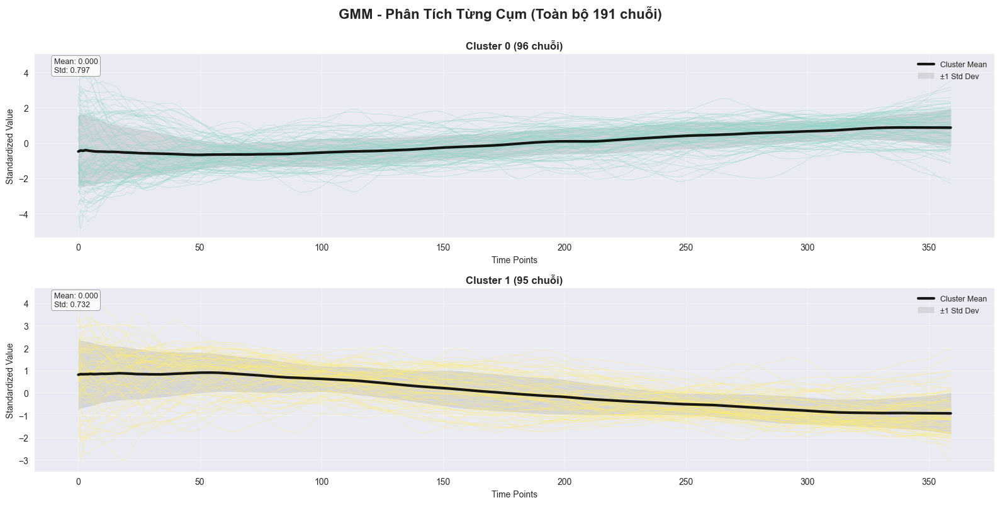


GMM:
  • Cluster 0: 96 chuỗi (50.3%)
  • Cluster 1: 95 chuỗi (49.7%)


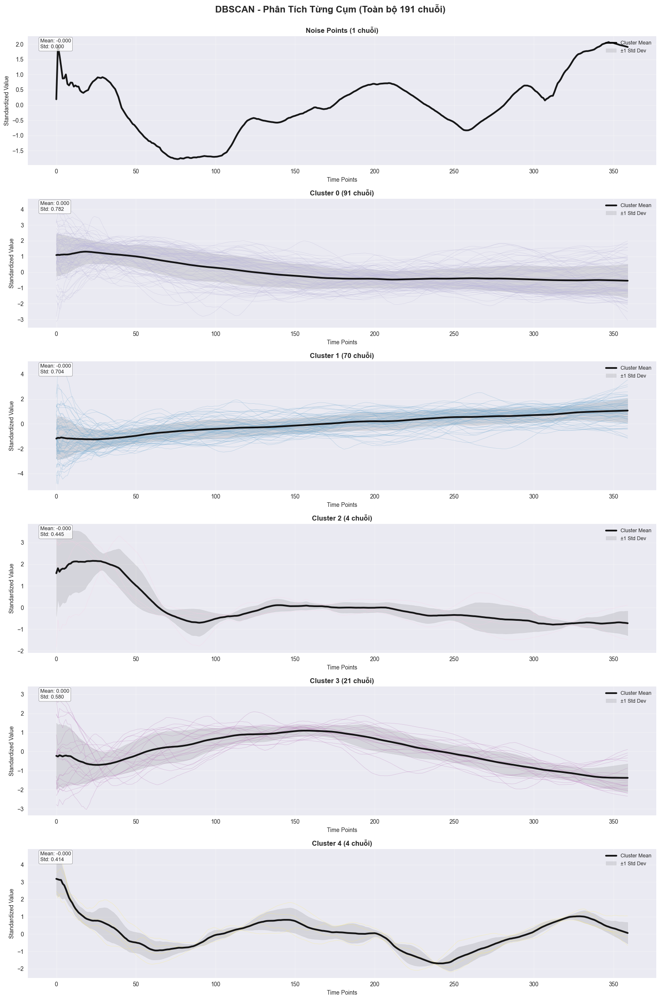


DBSCAN:
  • Noise: 1 chuỗi (0.5%)
  • Cluster 0: 91 chuỗi (47.6%)
  • Cluster 1: 70 chuỗi (36.6%)
  • Cluster 2: 4 chuỗi (2.1%)
  • Cluster 3: 21 chuỗi (11.0%)
  • Cluster 4: 4 chuỗi (2.1%)

✅ Hoàn thành visualization cho tất cả 4 thuật toán với toàn bộ 191 chuỗi dữ liệu!


In [40]:

# plot_clusters_lineplot_all_methods(clustering_results, data_scaled)
plot_clusters_lineplot_all_methods(clustering_results, data_scaled)